In [1]:
%matplotlib inline

In [2]:
import pandas as pd
import os
import shutil
from Bio import SeqIO
from Bio import AlignIO
import distance
import editdistance
import math
import subprocess
import numpy as np
import re
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import collections
import pybedtools
import joblib
import itertools as it
import pathlib
import scipy
import sys
sys.modules['sklearn.externals.joblib'] = joblib
from sklearn.externals.joblib import Parallel, delayed
import matplotlib.patches as patches
from matplotlib.ticker import FormatStrFormatter
import matplotlib.ticker as ticker

In [3]:
import plotly.express as px

In [4]:
#Input species name based on the 
#Species_DICT= {}
#Species_DICT['APSI']= 'APSI'
Species = 'Pst134E'
GENOME_PATH = os.path.abspath('../Mating_type/genome/seperate_haplotype/')
YN00_PATH = os.path.join(GENOME_PATH, 'yn00.ctl')
############yn00.ctl file:###############################
#seqfile = cds_codon.aln * sequence data file name
#outfile = yn.out * main result file
#verbose = 0 * 1: detailed output (list sequences), 0: concise output
#icode = 0 * 0:universal code; 1:mammalian mt; 2-10:see below
#weighting = 0 * weighting pathways between codons (0/1)?
#commonf3x4 = 0 * use one set of codon freqs for all pairs (0/1)?


In [5]:
Species_Path = os.path.join(GENOME_PATH, '%s' % Species)
if not os.path.exists(Species_Path):
       os.mkdir(os.path.join(GENOME_PATH, '%s' % Species))
BASE_OUT_PATH = os.path.join(Species_Path, 'output')
FIGURE_PATH = os.path.join(Species_Path, 'figures')
if not os.path.exists(FIGURE_PATH):
    os.mkdir(FIGURE_PATH)
if not os.path.exists(BASE_OUT_PATH):
    os.mkdir(BASE_OUT_PATH)

In [7]:
PAML_PATH = os.path.join(Species_Path, 'paml')
if not os.path.exists(PAML_PATH):
       os.mkdir(os.path.join(Species_Path, 'paml'))
shutil.copy2(YN00_PATH, PAML_PATH)

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pst134E/paml/yn00.ctl'

In [14]:
#copy neccessary files to corresponding species_path
#for key, value in Species_DICT.items():
#    Species_Path = os.path.join(GENOME_PATH, '%s' % value)
#    shutil.copy2(GENOME_PATH + '/' + key + '_h.faa' , Species_Path)
#    shutil.copy2(GENOME_PATH + '/' + key + '_p.faa' , Species_Path) 
shutil.copy2(GENOME_PATH + '/' + Species + '_h.faa' , Species_Path)
shutil.copy2(GENOME_PATH + '/' + Species + '_p.faa' , Species_Path) 
shutil.copy2(GENOME_PATH + '/' + Species + '_h.gff' , Species_Path)
shutil.copy2(GENOME_PATH + '/' + Species + '_p.gff' , Species_Path) 
shutil.copy2(GENOME_PATH + '/' + Species + '_h.cds' , Species_Path)
shutil.copy2(GENOME_PATH + '/' + Species + '_p.cds' , Species_Path) 

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pst134E/Pst134E_p.cds'

In [ ]:
#Run Orthofinder
#for key, value in Species_DICT.items():
#        Species_Path = os.path.join(GENOME_PATH, '%s' % key)
#        OF_options = ['-f']
#        OF_options.append(Species_Path)
#        OF_options.append('-t 16')
#        OF_command = 'orthofinder %s' % ' '.join(OF_options)
#        print(OF_command)
#       subprocess.check_output(OF_command, shell=True, stderr=subprocess.STDOUT)
OF_options = ['-f']
OF_options.append(Species_Path)
OF_options.append('-t 16')
OF_command = 'orthofinder %s' % ' '.join(OF_options)
print(OF_command)
subprocess.check_output(OF_command, shell=True, stderr=subprocess.STDOUT)

In [108]:
Species_Ortho_Path = os.path.join(Species_Path, 'OrthoFinder', 'Results_Jul29')
Orthogroups_df = os.path.join(Species_Ortho_Path, 'Orthogroups') 
OG_Genecount = pd.read_csv(os.path.join(Orthogroups_df, 'Orthogroups.GeneCount.tsv'), sep='\t', header='infer')
#classify into three types, primary = haploid, primary < haploid, primary > haploid
total_gene_count = OG_Genecount['Total'].sum()
OG_p_uniq = OG_Genecount.loc[(OG_Genecount['%s_h' % Species] == 0)]
sum_OG_p_uniq = OG_p_uniq['%s_p' % Species].sum() 
OG_h_uniq = OG_Genecount.loc[(OG_Genecount['%s_p' % Species] == 0)]
sum_OG_h_uniq = OG_h_uniq['%s_h' % Species].sum() 
OG_Genecount.loc[OG_Genecount['%s_h' % Species] < OG_Genecount['%s_p' % Species]]
print('Total numbers of genes: %s' % total_gene_count)
print('Total numbers of orthogroup: %s' % len(OG_Genecount))
print('Total numbers of orthogroup unique in primary assembly: %s' % len(OG_p_uniq))
print('Total numbers of genes unique in primary assembly: %s' % sum_OG_p_uniq)
print('Total numbers of orthogroup unique in haploid assembly: %s' % len(OG_h_uniq))
print('Total numbers of genes unique in haploid assembly: %s' % sum_OG_h_uniq)

Total numbers of genes: 27315
Total numbers of orthogroup: 11026
Total numbers of orthogroup unique in primary assembly: 95
Total numbers of genes unique in primary assembly: 359
Total numbers of orthogroup unique in haploid assembly: 101
Total numbers of genes unique in haploid assembly: 344


In [9]:
#Define output folder for proteinortho, although proteinortho generate output file in the same folder as this script
PROTEINORTHO_OUT_PATH = os.path.join(Species_Path, 'proteinortho')
if not os.path.exists(PROTEINORTHO_OUT_PATH):
    os.mkdir(PROTEINORTHO_OUT_PATH)
def getortho(species):
    !proteinortho6.pl -synteny -cpus=16 -singles -project={species} /home/zhenyan/Mating_type/genome/seperate_haplotype/{species}/{species}_p.faa /home/zhenyan/Mating_type/genome/seperate_haplotype/{species}/{species}_h.faa
    return getortho
getortho(Species)
shutil.copy2(Species + '.proteinortho.tsv' , PROTEINORTHO_OUT_PATH)
shutil.copy2(Species + '.poff-graph' , PROTEINORTHO_OUT_PATH)
shutil.copy2(Species + '.poff.tsv' , PROTEINORTHO_OUT_PATH)

*****************************************************************
Proteinortho with PoFF version 6.0.31 - An orthology detection tool
*****************************************************************
Using 16 CPU threads, Detected 'diamond' version 2.0.11
Checking input files.
Checking /home/zhenyan/Mating_type/genome/seperate_haplotype/Pst134E/Pst134E_p.faa... /home/zhenyan/Mating_type/genome/seperate_haplotype/Pst134E/Pst134E_p.faa	15431 genes	ok
Checking /home/zhenyan/Mating_type/genome/seperate_haplotype/Pst134E/Pst134E_h.faa... /home/zhenyan/Mating_type/genome/seperate_haplotype/Pst134E/Pst134E_h.faa	15137 genes	ok

**Step 1**
Generating indices.
Building database for '/home/zhenyan/Mating_type/genome/seperate_haplotype/Pst134E/Pst134E_p.faa'	(15431 sequences)
Building database for '/home/zhenyan/Mating_type/genome/seperate_haplotype/Pst134E/Pst134E_h.faa'	(15137 sequences)

**Step 2** using diamond with : synteny
Running blast analysis: 100% (1/1)                                 

'/home/zhenyan/Mating_type/genome/seperate_haplotype/Pst134E/proteinortho/Pst134E.poff.tsv'

In [10]:
proteinortho = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.proteinortho.tsv'), sep='\t', header='infer')
graph_header= ['Target', 'Query', 'evalue_ab', 'bitscore_ab', 'evalue_ba', 'bitscore_ba', 'same_strand' , 'simscore']
poff_graph = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff-graph'), sep='\t', names=graph_header, header=None, comment='#')
poff_tsv = pd.read_csv(os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff.tsv'), sep='\t', header='infer')

In [11]:
proorthograph_fh=os.path.join(PROTEINORTHO_OUT_PATH, Species + '.proteinortho.tsv')
poff_graph_fh=os.path.join(PROTEINORTHO_OUT_PATH, Species + '.poff-graph')

In [12]:
#Read output of orthofinder

In [15]:
combine_p_h_faa = 'cat %s %s >%s' % (Species_Path + '/' + Species + '_p.faa', Species_Path + '/' + Species + '_h.faa', Species_Path + '/' + Species + '_ph.faa')
combine_p_h_cds = 'cat %s %s >%s' % (Species_Path + '/' + Species + '_p.cds', Species_Path + '/' + Species + '_h.cds', Species_Path + '/' + Species + '_ph.cds')
subprocess.check_output(combine_p_h_faa, shell=True, stderr=subprocess.STDOUT)
subprocess.check_output(combine_p_h_cds, shell=True, stderr=subprocess.STDOUT)

b''

In [16]:
def getFastaDict(fastaFile):
    d = {}
    for gene in SeqIO.parse(fastaFile, 'fasta'):
        d[gene.id] = gene
    return d

In [17]:
PH_PROTEIN_FASTA = os.path.join(Species_Path + '/' + Species + '_ph.faa')
PH_CDS_FASTA = os.path.join(Species_Path + '/' + Species + '_ph.cds')
SEQRECORD_PROTEIN_DICT = getFastaDict(PH_PROTEIN_FASTA)
SEQRECORD_CDS_DICT = getFastaDict(PH_CDS_FASTA)
threads = 8

In [18]:
#poff_graph=open(poff_graph_fh).readlines()
#graph_header= ['Target', 'Query', 'evalue_ab', 'bitscore_ab', 'evalue_ba', 'bitscore_ba', 'same_strand' , 'simscore']
#po_df = pd.read_csv(poff_graph_fh, sep='\t', header=None, names=graph_header, comment='#' )

In [19]:
def writeAllelicFasta(alleleOne, alleleTwo, alleleType, outPath):
    '''writes fasta file containing fasta information for two alleles
    in the outPath'''
    assert(alleleType.upper() in ['CDS', 'GENE', 'PROTEIN'])
    seqRecordDict = globals()['SEQRECORD_' + alleleType.upper() + '_DICT']
    try:
        alleleSeqRecords = [seqRecordDict[alleleOne], seqRecordDict[alleleTwo]]
    except KeyError:
        print(alleleOne)
        print(alleleTwo)
        print(alleleType)
        sys.exit()
    with open(os.path.join(outPath, alleleType.lower() + '.fa'), 'w') as outFile:
        SeqIO.write(alleleSeqRecords, outFile, 'fasta')
    return True

In [20]:
# Define paml_script.sh
def writeAlignmentScript(alleleOutPath, scriptLoc = os.path.join(PAML_PATH, 'paml_script.sh')):
    with open(scriptLoc, 'a') as outFile:
        print('cd %s' % alleleOutPath, file=outFile)
        print('muscle -clwstrict -in protein.fa -out protein.aln', file=outFile)
        print('pal2nal.pl -output paml protein.aln cds.fa > cds_codon.aln', file=outFile)
        print('pal2nal.pl protein.aln cds.fa > cds_codon.clustal', file=outFile)
        print('cp %s/yn00.ctl ./' % PAML_PATH, file=outFile)
        print('yn00', file=outFile)
    return True

In [21]:
def prepareAlignmentBashScript(scriptLoc = os.path.join(PAML_PATH, 'paml_script.sh')):
    with open(scriptLoc, 'w') as pamlScript:
        print('#!/bin/bash', file=pamlScript)

    for index, [Query, Target] in alleleDf.iloc[:, :2].iterrows():
        #if we don't have a blast hit skip.
        if pd.isnull(Target):
            continue
        else:
            alleleOutPath = os.path.join(PAML_PATH, '%s_%s' % (Query, Target))
            if not os.path.exists(alleleOutPath):
                os.mkdir(os.path.join(PAML_PATH, '%s_%s' % (Query, Target)))
            writeAllelicFasta(Query, Target, 'CDS', alleleOutPath)
            writeAllelicFasta(Query, Target, 'PROTEIN', alleleOutPath)
            writeAlignmentScript(alleleOutPath, os.path.join(PAML_PATH, 'paml_script.sh'))
    return True

In [22]:
alleleDf = poff_graph.copy()
alleleDf['folder'] = alleleDf.Target + '_' + alleleDf.Query
alleleDf.set_index('folder', inplace=True)

In [23]:
prepareAlignmentBashScript(os.path.join(PAML_PATH, 'paml_script.sh'))

True

In [24]:
#run paml script
!bash {os.path.join(PAML_PATH, 'paml_script.sh')}


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 501, max 501, avg 501
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1503
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      501 /      501 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patterns..  0:00
         119 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 119, max 120, avg 119
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    32 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    32 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6354
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at     2118 /     2118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 712, max 712, avg 712
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      364 /      364 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 288, avg 288
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      159 /      159 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 347, max 347, avg 347
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1041
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1620
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      540 /      540 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 261, max 261, avg 261
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 783
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1029
Reading sequences, sequential format..
Counting site patterns..  0:00
         205 patterns at      232 /      232 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1733, max 2406, avg 2069
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    31 MB(16%)  Iter   1  100.00%  Align node       
00:00:01    31 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 7221
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      166 /      166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 298, max 298, avg 298
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2733
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      809 /      809 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 595, max 595, avg 595
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 273
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       91 /       91 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 698, max 717, avg 707
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2151
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      320 /      320 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 346, max 346, avg 346
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      378 /      378 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 405, max 405, avg 405
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 383, max 383, avg 383
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1149
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 747
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      249 /      249 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 265, max 265, avg 265
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 795
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 121, avg 114
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 873
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      291 /      291 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 611, max 611, avg 611
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1833
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2805
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      717 /      717 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 89, max 89, avg 89
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 267
Reading sequences, sequential format..
Counting site patterns.

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1959
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      653 /      653 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 435, max 435, avg 435
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 558
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      186 /      186 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 703, max 703, avg 703
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2109
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1524
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      471 /      471 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 274, max 383, avg 328
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1149
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      172 /      172 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 386, max 386, avg 386
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1998
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      494 /      494 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 281, max 281, avg 281
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      142 /      142 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 523, max 542, avg 532
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1824
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      608 /      608 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 393, max 394, avg 393
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1182
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      216 /      216 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 306, max 306, avg 306
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 918
Reading sequences, sequential format..
Counting site pattern

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 679, max 679, avg 679
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       84 /       84 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 249, max 249, avg 249
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 747
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1242
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      414 /      414 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 254, max 254, avg 254
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1311
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      437 /      437 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 275, max 275, avg 275
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 825
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 591
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      197 /      197 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 159, avg 159
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site pattern

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      164 /      164 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 514, max 514, avg 514
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      193 /      193 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 282, max 305, avg 293
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 915
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      423 /      423 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 425, max 425, avg 425
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      117 /      117 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 65, max 65, avg 65
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 195
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1194
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 376, max 376, avg 376
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1128
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2871
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      549 /      549 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 145, max 145, avg 145
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 505, max 505, avg 505
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 696
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      232 /      232 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 296, max 296, avg 296
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1485
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      495 /      495 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2235
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      744 /      744 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 202, max 205, avg 203
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2847
Reading sequences, sequential format..
Counting site patterns..  0:00
         114 patterns at      880 /      880 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 409, max 409, avg 409
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 114, max 124, avg 119
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      419 /      419 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 468, max 551, avg 509
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1671
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 372
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      123 /      123 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 128, max 128, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1956
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      593 /      593 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 661, max 661, avg 661
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1983
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      429 /      429 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 775, max 788, avg 781
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2367
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1311
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      437 /      437 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1873, max 1873, avg 1873
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    30 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    30 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      123 /      123 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 183, max 241, avg 212
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 723
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2670
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      766 /      766 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1040, max 1044, avg 1042
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 723
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      241 /      241 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 360, max 360, avg 360
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1266
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      422 /      422 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 271, max 505, avg 388
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      201 /      201 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 263, max 263, avg 263
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3120
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1009 /     1009 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 314, max 314, avg 314
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2535
Reading sequences, sequential format..
Counting site patterns..  0:00
         121 patterns at      695 /      695 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 389, max 503, avg 446
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1242
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      414 /      414 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 697, max 697, avg 697
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       82 /       82 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 709, max 709, avg 709
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2127
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2211
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      730 /      730 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 335, max 335, avg 335
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 582
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 292, max 306, avg 299
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 918
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      292 /      292 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 129, max 129, avg 129
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 173, max 191, avg 182
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 633
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 971, max 971, avg 971
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2913
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      971 /      971 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 947, max 947, avg 947
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2841
R

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2196
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      732 /      732 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1112, max 1274, avg 1193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3822
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 343, max 343, avg 343
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1029
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      139 /      139 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 509, max 509, avg 509
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1527
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1830
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      610 /      610 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 168, max 168, avg 168
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1956
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      356 /      356 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 417, max 417, avg 417
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1404
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      436 /      436 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 333, max 333, avg 333
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 999
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 189, max 189, avg 189
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      351 /      351 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 542, max 542, avg 542
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      306 /      306 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 16.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 611, max 639, avg 625
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1917
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 514, max 522, avg 518
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1566
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 804
Reading sequences, sequential format..
Counting site patterns..  0:00
         121 patterns at      247 /      247 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 423, max 428, avg 425
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1284
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1518
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      345 /      345 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 218, max 245, avg 231
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 735
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2241
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      747 /      747 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 271, max 335, avg 303
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 514, max 514, avg 514
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      426 /      426 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 374, max 487, avg 430
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 990
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      329 /      329 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 213, avg 197
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 639
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1938
Reading sequences, sequential format..
Counting site patterns..  0:00
         126 patterns at      644 /      644 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 434, max 472, avg 453
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 360, max 360, avg 360
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      208 /      208 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 224, max 224, avg 224
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3303
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1101 /     1101 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 367, max 367, avg 367
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1101
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 999
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      274 /      274 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 353, max 477, avg 415
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1434
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at       95 /       95 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 282, max 282, avg 282
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1200
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      356 /      356 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 416, max 428, avg 422
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1290
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 678
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 713, max 776, avg 744
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2328
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1116
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      372 /      372 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 265, max 374, avg 319
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1134
Reading sequences, sequential format..
Counting site patte

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3270
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1063 /     1063 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 514, max 517, avg 515
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      286 /      286 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 387, max 467, avg 427
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1530
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1365
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      394 /      394 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 83, max 83, avg 83
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 873
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 274, max 292, avg 283
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 876
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 170, max 170, avg 170
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 510
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2241
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      585 /      585 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 689, max 693, avg 691
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2094
Reading sequences, sequential format..
Counting site patte

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 996
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      266 /      266 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 187, avg 172
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 218, max 218, avg 218
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      218 /      218 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1956
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      652 /      652 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 311, max 311, avg 311
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1296
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      432 /      432 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 149, max 149, avg 149
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 896, max 896, avg 896
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

protein 2 seqs, lengths min 112, max 112, avg 112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      112 /      112 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 398, max 398, avg 398
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 525, max 525, avg 525
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1575
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      525 /      525 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 164, max 164, avg 164
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 492
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      164 /      164 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 651, max 651, avg 651
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1953
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      651 /      651 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2130
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      710 /      710 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 438, max 438, avg 438
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      351 /      351 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 569, max 569, avg 569
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1707
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1260
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      420 /      420 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 212, avg 181
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 636
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 497, max 497, avg 497
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1491
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1059
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      353 /      353 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 80, max 80, avg 80
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 240
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      231 /      231 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 231, max 318, avg 274
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 954
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 558, max 560, avg 559
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1680
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2346
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      782 /      782 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 345, max 345, avg 345
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 132, max 132, avg 132
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter

protein 2 seqs, lengths min 323, max 323, avg 323
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      323 /      323 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 258, max 258, avg 258
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1521
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      507 /      507 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 312, max 312, avg 312
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 113, max 113, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 150, max 151, avg 150
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 397, max 397, avg 397
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      438 /      438 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 489, max 520, avg 504
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560


YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 377, max 377, avg 377
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1131
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2727
Reading sequences, sequential format..
Counting site patterns..  0:00
         129 patterns at      904 /      904 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 15.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 784, max 790, avg 787
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1386
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      447 /      447 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 139, max 139, avg 139
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      137 /      137 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 629, max 659, avg 644
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1980
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       97 /       97 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 364, max 364, avg 364
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1440
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      480 /      480 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 515, max 515, avg 515
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1545
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 804
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      201 /      201 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 319, max 319, avg 319
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 822
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      208 /      208 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 398, max 417, avg 407
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1251
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      163 /      163 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 163, max 163, avg 163
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      420 /      420 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 884, max 884, avg 884
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2652
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1800
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      600 /      600 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 583, avg 471
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      181 /      181 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 491, max 491, avg 491
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1473
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2217
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      738 /      738 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 582, max 584, avg 583
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1752
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 232, max 232, avg 232
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 696
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1827
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      609 /      609 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 548, max 548, avg 548
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1683
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      378 /      378 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1522, max 1526, avg 1524
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4590
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1305
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      358 /      358 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 209, max 209, avg 209
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 627
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1311
Reading sequences, sequential format..
Counting site patterns..  0:00
         127 patterns at      409 /      409 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 186
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       62 /       62 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 178, max 208, avg 193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2094
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      698 /      698 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 78, max 143, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 169, max 169, avg 169
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3189
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at     1063 /     1063 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 176, max 199, avg 187
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1056
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      352 /      352 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 124, max 129, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1650
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      529 /      529 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 385, max 530, avg 457
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1590
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 624, max 624, avg 624
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1872
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      538 /      538 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 376, max 376, avg 376
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1128
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      136 /      136 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 901, max 901, avg 901
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2703
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1653
Reading sequences, sequential format..
Counting site patterns..  0:00
         115 patterns at      546 /      546 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 239, max 239, avg 239
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 408, max 419, avg 413
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2964
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      988 /      988 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 333, max 352, avg 342
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1056
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1620
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      540 /      540 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 204, avg 192
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      257 /      257 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1169, max 1169, avg 1169
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Ma

protein 2 seqs, lengths min 331, max 331, avg 331
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 993
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      331 /      331 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 586, max 586, avg 586
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1176
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      392 /      392 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 409, max 559, avg 484
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1677
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1641
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      544 /      544 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 293, max 409, avg 351
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1227
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2559
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      815 /      815 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 125, max 183, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 729
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      243 /      243 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 257, max 257, avg 257
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1320
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      438 /      438 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 413, max 413, avg 413
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1356
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      451 /      451 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 491, max 491, avg 491
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1473
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      456 /      456 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 145, avg 133
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 174, max 174, avg 174
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1245
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      390 /      390 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 629, max 635, avg 632
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1917
Reading sequences, sequential format..
Counting site patte

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3243
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1071 /     1071 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 391, max 474, avg 432
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
         150 patterns at      394 /      394 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 396, max 396, avg 396
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1188
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      456 /      456 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 456, max 456, avg 456
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      419 /      419 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 369, max 369, avg 369
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Ite


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 531, max 706, avg 618
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2118
Reading sequences, sequential format..
Counting site patterns..  0:00
         164 patterns at      531 /      531 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 105, max 110, avg 107
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 921, max 1062, avg 991
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3186
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      921 /      921 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic A

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      315 /      315 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 198, max 226, avg 212
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4008
Reading sequences, sequential format..
Counting site patterns..  0:00
         141 patterns at     1308 /     1308 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 812, max 1528, avg 1170
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Ma

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      173 /      173 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 139, max 162, avg 150
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2367
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      789 /      789 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 618, max 618, avg 618
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1854
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 160, max 221, avg 190
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1884
Reading sequences, sequential format..
Counting site patterns..  0:00
         391 patterns at      525 /      525 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 548, max 631, avg 589
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1893
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 633
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      211 /      211 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 276, max 276, avg 276
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 828
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       81 /       81 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 218, max 222, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       82 /       82 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 158, max 158, avg 158
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 210
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       70 /       70 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 101, max 101, avg 101
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 542, max 542, avg 542
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1803
Reading sequences, sequential format..
Counting site patterns..  0:00
         137 patterns at      431 /      431 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 348, max 362, avg 355
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1086
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      186 /      186 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 702, max 702, avg 702
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2106
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1527
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      509 /      509 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 234, max 234, avg 234
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2472
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      824 /      824 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 749, max 754, avg 751
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      101 /      101 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 653, max 653, avg 653
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1959
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 975
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      325 /      325 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 189, max 189, avg 189
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1956
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      652 /      652 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1281, max 1284, avg 1282
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3921
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      479 /      479 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 939, max 939, avg 939
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2817
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1695
Reading sequences, sequential format..
Counting site patterns..  0:00
         166 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 155, max 155, avg 155
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1818
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      606 /      606 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 66, max 66, avg 66
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 198
Reading sequences, sequential format..
Counting site patterns.

protein 2 seqs, lengths min 421, max 421, avg 421
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1263
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      421 /      421 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 242, max 244, avg 243
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1491
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      497 /      497 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 188, max 188, avg 188
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 378, max 403, avg 390
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      378 /      378 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 437, max 441, avg 439
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1755
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      585 /      585 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 735, max 735, avg 735
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2205
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 555
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      185 /      185 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 143, max 143, avg 143
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 870
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      289 /      289 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1345, max 1346, avg 1345
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4041
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1809
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      248 /      248 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 350, max 413, avg 381
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1506
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 316, max 316, avg 316
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 948
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1641
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      518 /      518 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 316, max 317, avg 316
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1161
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      387 /      387 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 18.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 448, max 448, avg 448
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 981
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      223 /      223 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 864, max 864, avg 864
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2592
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at      126 /      126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 354, max 370, avg 362
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1110
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      123 /      123 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 570, max 570, avg 570
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1710
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      218 /      218 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 687, max 699, avg 693
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2097
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1578
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      332 /      332 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 344, max 344, avg 344
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1032
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2772
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      924 /      924 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 177, max 177, avg 177
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 531
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2535
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      823 /      823 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 142, max 142, avg 142
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 261, max 261, avg 261
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 783
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      261 /      261 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 64, max 84, avg 74
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00% 

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site patterns..  0:00
         161 patterns at      191 /      191 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 337, max 337, avg 337
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      360 /      360 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 733, max 956, avg 844
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2904
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 346, avg 317
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1164
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      347 /      347 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 965, max 1003, avg 984
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3009
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 618
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 298, max 298, avg 298
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      156 /      156 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 855, max 1179, avg 1017
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3537
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1545
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      515 /      515 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 522, max 731, avg 626
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2196
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      464 /      464 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 549, max 549, avg 549
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1647
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1818
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      606 /      606 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 440, max 440, avg 440
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1320
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      156 /      156 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 467, max 495, avg 481
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1485
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1086
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      362 /      362 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 570, max 570, avg 570
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1710
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      340 /      340 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 689, max 828, avg 758
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2595
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       89 /       89 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 312, max 312, avg 312
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1545
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      515 /      515 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 306, max 490, avg 398
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1470
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at       93 /       93 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 796, max 796, avg 796
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2388
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      228 /      228 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 550, max 550, avg 550
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1650
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1467
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      483 /      483 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 871, max 871, avg 871
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2613
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1908
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      636 /      636 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 247, max 248, avg 247
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1506
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      362 /      362 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 435, max 436, avg 435
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1308
Reading sequences, sequential format..
Counting site patte

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 307, max 309, avg 308
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

protein 2 seqs, lengths min 1919, max 1919, avg 1919
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    30 MB(15%)  Iter   1  100.00%  Align node       
00:00:01    30 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5757
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at     1919 /     1919 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 327, max 327, avg 327
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  1

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 409, max 409, avg 409
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1227
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1998
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      666 /      666 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 239, max 239, avg 239
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      126 /      126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 382, max 389, avg 385
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1167
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.63

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 625, max 625, avg 625
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1875
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 993
Reading sequences, sequential format..
Counting site patterns..  0:00
         103 patterns at      304 /      304 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 278, max 278, avg 278
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 834
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1419
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      416 /      416 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 285, max 319, avg 302
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patterns..  0:00
         117 patterns at      215 /      215 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 187, max 187, avg 187
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      105 /      105 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 107, max 187, avg 147
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1194
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      311 /      311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 332, max 393, avg 362
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      448 /      448 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 171, max 171, avg 171
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1044
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      348 /      348 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1176, max 1180, avg 1178
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3552
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patterns..  0:01
          56 patterns at      196 /      196 sites (100.0%),  0:01


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:01

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 335, max 335, avg 335
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1005
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 72, max 90, avg 81
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 514, max 514, avg 514
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1191
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      397 /      397 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 340, max 340, avg 340
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1782
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      485 /      485 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 893, max 893, avg 893
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1590
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      530 /      530 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 257, max 454, avg 355
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1362
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1977
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      659 /      659 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 476, max 518, avg 497
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1554
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2220
Reading sequences, sequential format..
Counting site patterns..  0:00
         122 patterns at      737 /      737 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 197, max 197, avg 197
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4260
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     1420 /     1420 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 781, max 822, avg 801
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 737, max 787, avg 762
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2361
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 726
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      242 /      242 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 999, max 1421, avg 1210
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4599
Reading sequences, sequential format..
Counting site patt

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1671
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      557 /      557 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 469, max 470, avg 469
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 365, max 498, avg 431
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1494
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1692
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      484 /      484 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 721, max 721, avg 721
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2163
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 96, max 96, avg 96
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at       96 /       96 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 237, max 237, avg 237
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00% 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2010
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      620 /      620 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 310, max 398, avg 354
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1194
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1617
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      539 /      539 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 187, max 187, avg 187
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 148, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      110 /      110 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 562, max 562, avg 562
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 686, max 742, avg 714
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2226
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      686 /      686 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 437, max 442, avg 439
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1329
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1074
Reading sequences, sequential format..
Counting site patterns..  0:00
         171 patterns at      311 /      311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 328, max 328, avg 328
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1326
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      429 /      429 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 184, max 214, avg 199
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 321
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at      107 /      107 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 904, max 904, avg 904
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2712
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      167 /      167 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 301, max 338, avg 319
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    29 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5304
Reading sequences, sequential format..
Counting site patterns..  0:00
         174 patterns at     1767 /     1767 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 713, max 713, avg 713
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 204, max 204, avg 204
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1974
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      634 /      634 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1158, max 1158, avg 1158
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3474
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      311 /      311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 93, max 152, avg 122
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      123 /      123 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 930, max 930, avg 930
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2790
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 431, max 536, avg 483
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1608
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      431 /      431 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 440, max 440, avg 440
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 300, max 342, avg 321
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 424, max 424, avg 424
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1272
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      424 /      424 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1291, max 2066, avg 1678
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  1

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2229
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      742 /      742 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 586, max 586, avg 586
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1758
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1782
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      594 /      594 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1193, max 1193, avg 1193
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3579
Reading sequences, sequential format..
Counting site pa

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2739
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      913 /      913 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 819, max 819, avg 819
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 372
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      124 /      124 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 281, max 281, avg 281
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1341
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      247 /      247 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 389, max 415, avg 402
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1323
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1191
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      397 /      397 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 486, max 486, avg 486
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1458
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 366, max 380, avg 373
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1140
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      366 /      366 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 444, max 444, avg 444
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 951, max 981, avg 966
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2943
Reading sequences, sequential format..
Counting site patter

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4578
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1526 /     1526 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 395, max 421, avg 408
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 255, max 255, avg 255
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1554
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      516 /      516 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 570, max 570, avg 570
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1710
Reading sequences, sequential format..
Counting site patte

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3378
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1126 /     1126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 68, max 72, avg 70
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       93 /       93 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 173, max 192, avg 182
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1356
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      303 /      303 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 395, max 395, avg 395
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      290 /      290 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 281, max 283, avg 282
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 198
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at       66 /       66 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 565, max 587, avg 576
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1761
Reading sequences, sequential format..
Counting site patter

00:00:00    31 MB(16%)  Iter   1  100.00%  Align node       
00:00:00    31 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6087
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at     2027 /     2027 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 316, max 394, avg 355
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      180 /      180 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 467, max 564, avg 515
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1692
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 587, max 587, avg 587
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1761
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      587 /      587 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 435, max 435, avg 435
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

protein 2 seqs, lengths min 598, max 657, avg 627
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1971
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      598 /      598 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 113, max 113, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 90, max 116, avg 103
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1668
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      548 /      548 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 327, max 327, avg 327
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 981
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2139
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at      713 /      713 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 293, max 407, avg 350
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1221
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 273
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at       91 /       91 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 77, max 77, avg 77
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      124 /      124 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 293, max 293, avg 293
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 879
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1830
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      610 /      610 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 519, max 542, avg 530
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 196, max 196, avg 196
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       81 /       81 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2877
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at      959 /      959 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 11.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 182, max 182, avg 182
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      292 /      292 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 474, max 474, avg 474
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2013
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      670 /      670 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 72, max 72, avg 72
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1803
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      365 /      365 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 535, max 586, avg 560
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1758
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1899
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      608 /      608 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 648, max 665, avg 656
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1995
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1677
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      536 /      536 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 136, max 136, avg 136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1851
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      617 /      617 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 195, max 195, avg 195
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 121, max 121, avg 121
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 243, max 243, avg 243
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 729
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1482
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      494 /      494 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 257, max 257, avg 257
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1074
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      358 /      358 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 375, max 375, avg 375
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1125
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 97, max 97, avg 97
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       97 /       97 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1220, max 1220, avg 1220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 618
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      206 /      206 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 206, max 206, avg 206
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 618
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1002
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      334 /      334 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 403, max 403, avg 403
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1263
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      298 /      298 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 393, max 393, avg 393
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      448 /      448 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 99, max 125, avg 112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 939
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      313 /      313 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 213, max 213, avg 213
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 639
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1452
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      480 /      480 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 310, max 310, avg 310
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2952
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      984 /      984 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 511, max 548, avg 529
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2292
Reading sequences, sequential format..
Counting site patterns..  0:00
         119 patterns at      641 /      641 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1020, max 1085, avg 1052
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      355 /      355 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 202, max 202, avg 202
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 218, max 218, avg 218
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3309
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      981 /      981 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 530, max 530, avg 530
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2871
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      668 /      668 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 404, max 404, avg 404
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2769
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      520 /      520 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 593, max 593, avg 593
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1122
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      373 /      373 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 518, max 549, avg 533
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1647
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 987
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      329 /      329 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 99, max 99, avg 99
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1584
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      528 /      528 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 369, max 435, avg 402
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1623
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1311
Reading sequences, sequential format..
Counting site patterns..  0:00
         152 patterns at      430 /      430 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 469, max 469, avg 469
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      312 /      312 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1512
Reading sequences, sequential format..
Counting site patterns..  0:00
         101 patterns at      501 /      501 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 257, max 257, avg 257
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 828
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      276 /      276 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 748, max 748, avg 748
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2244
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      225 /      225 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 427, max 427, avg 427
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1767
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      587 /      587 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 399, max 399, avg 399
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1650
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      550 /      550 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 511, max 511, avg 511
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2388
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      693 /      693 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 503, max 503, avg 503
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 396
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 317, max 317, avg 317
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1683
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      561 /      561 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 285, max 325, avg 305
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      184 /      184 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 182, avg 170
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 555
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at      182 /      182 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 718, max 752, avg 735
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2256
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2043
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      681 /      681 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 358, max 358, avg 358
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1074
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1062, max 1085, avg 1073
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3255
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1701
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      567 /      567 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 382, max 437, avg 409
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1218
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      406 /      406 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 779, max 923, avg 851
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2457
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      645 /      645 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 277, avg 277
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 252
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at       84 /       84 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 131, max 181, avg 156
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 543
Reading sequences, sequential format..
Counting site pattern

00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5091
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at     1659 /     1659 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 275, max 371, avg 323
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
         135 patterns at      315 /      315 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 410, max 412, avg 411
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1881
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      627 /      627 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 545, max 545, avg 545
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3729
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      920 /      920 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 251, max 251, avg 251
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 149, max 156, avg 152
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 468
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      149 /      149 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 356, max 356, avg 356
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 235, max 235, avg 235
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 705
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      235 /      235 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 446, max 481, avg 463
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      422 /      422 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 321
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      107 /      107 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 280, max 280, avg 280
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 840
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      238 /      238 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 223, max 223, avg 223
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      340 /      340 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 131, max 173, avg 152
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 519
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2589
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      863 /      863 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 609, max 609, avg 609
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      217 /      217 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 221, max 379, avg 300
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1224
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 285, max 285, avg 285
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 873
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      291 /      291 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 90, max 90, avg 90
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 261
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       87 /       87 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 900, max 901, avg 900
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2706
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      131 /      131 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 265, max 265, avg 265
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 795
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 201
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at       67 /       67 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 116, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 255
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       85 /       85 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 67, max 67, avg 67
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 201
Reading sequences, sequential format..
Counting site patterns..

protein 2 seqs, lengths min 440, max 441, avg 440
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1326
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      439 /      439 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 386, max 386, avg 386
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 67, max 126, avg 96
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       67 /       67 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1236
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      408 /      408 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 176, max 176, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1392
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      464 /      464 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1740
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      580 /      580 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 452, max 452, avg 452
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1356
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.14

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 397, max 397, avg 397
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1191
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      126 /      126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 75, max 75, avg 75
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 225
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      182 /      182 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 644, max 644, avg 644
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1932
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2001
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      667 /      667 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 304, max 532, avg 418
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1596
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1713
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      571 /      571 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 149, max 187, avg 168
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 228, max 228, avg 228
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      342 /      342 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 486, max 496, avg 491
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 2870, max 2870, avg 2870
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    38 MB(19%)  Iter   1  100.00%  Align node       
00:00:00    38 MB(19%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 8610
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1323
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      405 /      405 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1009, max 1009, avg 1009
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3027
Reading sequences, sequential format..
Counting site pa

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3408
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at     1134 /     1134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 265, max 265, avg 265
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 795
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      265 /      265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 445, max 445, avg 445
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1335
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2841
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      570 /      570 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 969, max 969, avg 969
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2907
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2106
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      702 /      702 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 147, max 150, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1350
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      426 /      426 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 515, max 515, avg 515
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      139 /      139 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 517, max 517, avg 517
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1551
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      140 /      140 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 309, max 318, avg 313
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2385
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      791 /      791 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 75, max 75, avg 75
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 225
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2172
Reading sequences, sequential format..
Counting site patterns..  0:00
          99 patterns at      718 /      718 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 524, max 524, avg 524
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1572
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2724
Reading sequences, sequential format..
Counting site patterns..  0:00
         109 patterns at      719 /      719 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 171, max 171, avg 171
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patterns..  0:00
         188 patterns at      263 /      263 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 549, max 552, avg 550
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1656
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      395 /      395 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 111, max 111, avg 111
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2220
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      739 /      739 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 425, max 425, avg 425
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1887
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      485 /      485 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 184, max 329, avg 256
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 987
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site patterns..  0:00
         171 patterns at      194 /      194 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 546
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      182 /      182 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 227, max 227, avg 227
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 681
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1167
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      389 /      389 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 390, max 390, avg 390
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1170
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 247, max 267, avg 257
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 801
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2025
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      575 /      575 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 247, max 347, avg 297
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1041
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2160
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      698 /      698 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 467, max 467, avg 467
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1383
Reading sequences, sequential format..
Counting site patterns..  0:00
         129 patterns at      392 /      392 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 106, max 106, avg 106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 366
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      111 /      111 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 555, max 555, avg 555
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1665
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3156
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      659 /      659 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 502, max 502, avg 502
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      298 /      298 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 263, max 283, avg 273
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 421, max 603, avg 512
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1809
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1605
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      535 /      535 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 100, max 104, avg 102
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 840
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      173 /      173 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 250, max 329, avg 289
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 987
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 581, max 614, avg 597
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1851
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 825
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      275 /      275 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 92, max 110, avg 101
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site patterns

protein 2 seqs, lengths min 146, max 146, avg 146
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 663, max 663, avg 663
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2124
Reading sequences, sequential format..
Counting site patterns..  0:00
         172 patterns at      516 /      516 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 235, max 383, avg 309
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1149
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      166 /      166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 669
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      200 /      200 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 208, max 208, avg 208
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 801
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      170 /      170 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 185, max 185, avg 185
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 555
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      311 /      311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 538, max 538, avg 538
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      183 /      183 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2022
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      499 /      499 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 242, max 242, avg 242
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 282
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at       94 /       94 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 190, max 190, avg 190
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 570
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      193 /      193 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 148, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      258 /      258 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 96, max 96, avg 96
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      105 /      105 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 206, max 206, avg 206
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 618
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1446
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      481 /      481 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 464, max 506, avg 485
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1518
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 963
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      321 /      321 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 516, max 516, avg 516
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1548
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 758, max 876, avg 817
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2628
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      139 /      139 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 244, max 244, avg 244
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1272
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      367 /      367 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 348, max 349, avg 348
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 396
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      132 /      132 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 257, avg 200
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site pattern

00:00:00    35 MB(17%)  Iter   1  100.00%  Align node       
00:00:00    35 MB(17%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 9663
Reading sequences, sequential format..
Counting site patterns..  0:00
         124 patterns at     1916 /     1916 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 396, max 396, avg 396
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 146, avg 146
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1596
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      532 /      532 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 225, max 225, avg 225
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      254 /      254 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 194, max 200, avg 197
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 604, max 606, avg 605
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1818
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      604 /      604 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 129, max 145, avg 137
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 381
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      127 /      127 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 122, avg 122
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 366
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1173
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      391 /      391 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 24.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 130, max 130, avg 130
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1632
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      544 /      544 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 544, max 547, avg 545
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1641
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      158 /      158 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 315, max 315, avg 315
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 945
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      202 /      202 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 64, max 123, avg 93
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site patterns.

protein 2 seqs, lengths min 169, max 169, avg 169
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 213, max 224, avg 218
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1965
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      655 /      655 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1494, max 1495, avg 1494
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:01    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4485
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1665
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      555 /      555 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 156, max 217, avg 186
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1383
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      461 /      461 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 81, max 81, avg 81
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2028
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      675 /      675 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 205, max 205, avg 205
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 285, max 285, avg 285
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      285 /      285 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 341, max 341, avg 341
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 238, max 329, avg 283
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 987
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      238 /      238 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 972
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      324 /      324 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.27

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 218, max 218, avg 218
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 198
Reading sequences, sequential format..
Counting site patterns..  0:00
          33 patterns at       66 /       66 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 144, max 144, avg 144
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      203 /      203 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 832, max 832, avg 832
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2496
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1512
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      504 /      504 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 356, max 356, avg 356
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1593
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      524 /      524 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 739, max 739, avg 739
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2217
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1806
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      602 /      602 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 353, max 353, avg 353
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1059
Reading sequences, sequential format..
Counting site patte

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      287 /      287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 359, avg 359
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1320
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      440 /      440 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 379, max 379, avg 379
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1137
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 100, max 100, avg 100
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1659
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      550 /      550 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 293, max 295, avg 294
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 885
Reading sequences, sequential format..
Counting site patter

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3498
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1166 /     1166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 131, max 131, avg 131
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1047
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      349 /      349 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 766, max 766, avg 766
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2298
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      131 /      131 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 151, avg 151
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 222
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       74 /       74 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1104, max 1104, avg 1104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3312
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1410
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      339 /      339 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 750, max 757, avg 753
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2403
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1686
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      562 /      562 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 300, max 300, avg 300
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2682
Reading sequences, sequential format..
Counting site patterns..  0:00
         100 patterns at      796 /      796 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1083, max 1083, avg 1083
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3249
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      199 /      199 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 237, max 237, avg 237
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 87, max 101, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1197
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      399 /      399 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.67

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 137, max 137, avg 137
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 411
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1146
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      382 /      382 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 561, max 592, avg 576
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1776
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2442
Reading sequences, sequential format..
Counting site patterns..  0:00
         103 patterns at      812 /      812 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 335, max 335, avg 335
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 210, max 210, avg 210
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 407, max 407, avg 407
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      230 /      230 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 19.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 106, max 106, avg 106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      178 /      178 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 359, avg 359
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 825
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      275 /      275 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 850, max 850, avg 850
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2550
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1254
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      418 /      418 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 184, max 210, avg 197
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 636
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1785
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      595 /      595 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 345, max 345, avg 345
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1332
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      262 /      262 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 286, max 286, avg 286
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 570, max 570, avg 570
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1710
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 222
Reading sequences, sequential format..
Counting site patterns..  0:00
          23 patterns at       74 /       74 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 347, max 347, avg 347
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1041
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1056
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      350 /      350 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 481, max 481, avg 481
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1443
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1563
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      521 /      521 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 159, avg 159
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 180
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       60 /       60 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 349, max 349, avg 349
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1047
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      171 /      171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 551, max 621, avg 586
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      204 /      204 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 308, max 308, avg 308
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      101 /      101 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 190, max 311, avg 250
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2670
Reading sequences, sequential format..
Counting site patterns..  0:00
         133 patterns at      887 /      887 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 299, max 299, avg 299
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 897
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      281 /      281 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 510, max 510, avg 510
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1530
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2889
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      963 /      963 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 693, max 709, avg 701
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1803
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      601 /      601 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 120, max 120, avg 120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 175, avg 175
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 106, max 106, avg 106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 819
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      203 /      203 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 158, max 173, avg 165
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1818
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      602 /      602 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 577, max 578, avg 577
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1734
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1698
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      411 /      411 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 313, max 313, avg 313
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 939
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      258 /      258 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 246, max 246, avg 246
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      129 /      129 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 189, max 189, avg 189
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 567
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1245
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      411 /      411 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 217, max 217, avg 217
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    27 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4254
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at     1418 /     1418 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 630, max 733, avg 681
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2118
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at      701 /      701 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 98, max 98, avg 98
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2382
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      512 /      512 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.29

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 249, max 249, avg 249
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 747
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at       78 /       78 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 407, max 407, avg 407
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1221
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 201, max 201, avg 201
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site patterns..  0:00
          81 patterns at      201 /      201 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 487, max 487, avg 487
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1173
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      391 /      391 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1027, max 1027, avg 1027
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3081
Reading sequences, sequential format..
Counting site pa

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      425 /      425 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 342, max 342, avg 342
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3819
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     1273 /     1273 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 841, max 888, avg 864
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1587
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      529 /      529 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 529, max 529, avg 529
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1587
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 372
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 528, max 528, avg 528
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1584
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 779, max 779, avg 779
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2337
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      779 /      779 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 584, max 584, avg 584
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2403
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      777 /      777 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 572, max 572, avg 572
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1716
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      572 /      572 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 472, max 472, avg 472
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      455 /      455 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1330, max 1330, avg 1330
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2790
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      930 /      930 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 467, max 467, avg 467
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 804
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      246 /      246 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 513, max 513, avg 513
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1539
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1473
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      361 /      361 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 968, max 968, avg 968
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2904
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 136, max 136, avg 136
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 883, max 884, avg 883
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2652
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 370, max 370, avg 370
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1110
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 834
Reading sequences, sequential format..
Counting site patterns..  0:00
         130 patterns at      249 /      249 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 507, max 507, avg 507
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1521
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1860
Reading sequences, sequential format..
Counting site patterns..  0:00
         155 patterns at      539 /      539 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 85, max 85, avg 85
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 255
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      166 /      166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 409, max 409, avg 409
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1227
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1311
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      437 /      437 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 478, max 478, avg 478
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1434
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2046
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      682 /      682 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 287, max 377, avg 332
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1485
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      480 /      480 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 203, max 203, avg 203
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1641
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      547 /      547 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 190, max 190, avg 190
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 570
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      284 /      284 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 153, max 174, avg 163
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2085
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      690 /      690 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1788
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      596 /      596 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 679, max 681, avg 680
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2052
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1575
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      525 /      525 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 124, max 126, avg 125
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 429, max 429, avg 429
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

protein 2 seqs, lengths min 425, max 442, avg 433
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1326
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      425 /      425 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 391, max 429, avg 410
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 195, max 218, avg 206
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      195 /      195 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 570
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      190 /      190 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 685, max 898, avg 791
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2694
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2973
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      991 /      991 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 608, max 626, avg 617
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 66, max 66, avg 66
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 198
Reading sequences, sequential format..
Counting site patterns..  0:00
          31 patterns at       66 /       66 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 239, max 239, avg 239
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00% 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 113, max 113, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

protein 2 seqs, lengths min 692, max 692, avg 692
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2076
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      692 /      692 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 285, max 316, avg 300
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3888
Reading sequences, sequential format..
Counting site patterns..  0:00
         158 patterns at     1296 /     1296 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 324, max 360, avg 342
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 414
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      138 /      138 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 483, max 747, avg 615
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2241
Reading sequences, sequential format..
Counting site patter

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3669
Reading sequences, sequential format..
Counting site patterns..  0:00
         144 patterns at     1136 /     1136 sites (100.0%),  0:01


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:01

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 403, max 437, avg 420
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      237 /      237 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 204, avg 181
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1902
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      634 /      634 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 517, max 517, avg 517
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1551
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      135 /      135 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 129, max 129, avg 129
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1872
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      624 /      624 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 381, max 421, avg 401
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1263
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 542, max 542, avg 542
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 768
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      256 /      256 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 481, max 482, avg 481
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1446
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      286 /      286 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 843, max 1203, avg 1023
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1266
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      422 /      422 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 385, max 385, avg 385
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 670, max 670, avg 670
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2010
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      670 /      670 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 333, max 334, avg 333
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 124, max 129, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      124 /      124 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      156 /      156 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 455, max 455, avg 455
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1365
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1152
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      384 /      384 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 588, max 588, avg 588
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1764
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1074
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      358 /      358 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 78, max 78, avg 78
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 234
Reading sequences, sequential format..
Counting site patterns.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      173 /      173 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 209, max 210, avg 209
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1611
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      537 /      537 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2502
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      834 /      834 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1111, max 1111, avg 1111
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 369
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      123 /      123 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 150, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      179 /      179 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 297, max 334, avg 315
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1002
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1596
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      526 /      526 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 310, max 310, avg 310
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 930
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1419
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      473 /      473 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 431, max 431, avg 431
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 364, max 364, avg 364
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 130, max 130, avg 130
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1578
Reading sequences, sequential format..
Counting site patterns..  0:00
         126 patterns at      463 /      463 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 260, max 260, avg 260
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 780
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 488, max 530, avg 509
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1593
Reading sequences, sequential format..
Counting site patter

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3867
Reading sequences, sequential format..
Counting site patterns..  0:00
         102 patterns at     1289 /     1289 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 249, max 249, avg 249
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at      108 /      108 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 482, max 482, avg 482
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1446
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 870
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      290 /      290 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 190, max 231, avg 210
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      118 /      118 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 254, max 254, avg 254
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      413 /      413 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 445, max 445, avg 445
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2235
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      745 /      745 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 337, max 502, avg 419
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1566
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      467 /      467 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 555, max 557, avg 556
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 500, max 500, avg 500
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1500
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 672
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      224 /      224 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 214, max 214, avg 214
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 642
Reading sequences, sequential format..
Counting site pattern

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 672
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      224 /      224 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 167, max 167, avg 167
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1335
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      445 /      445 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 280, max 311, avg 295
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      472 /      472 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 457, max 458, avg 457
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1374
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1824
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      608 /      608 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 443, max 443, avg 443
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1329
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1086
Reading sequences, sequential format..
Counting site patterns..  0:00
         194 patterns at      222 /      222 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 508, max 898, avg 703
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2694
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 90, max 98, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..

00:00:00    31 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    31 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6000
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at     2000 /     2000 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 999, max 999, avg 999
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1857
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      603 /      603 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 493, max 493, avg 493
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1479
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2871
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      957 /      957 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 890, max 904, avg 897
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2712
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1512, max 1512, avg 1512
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4536
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 291
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       97 /       97 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 665, max 665, avg 665
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1995
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1731
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      563 /      563 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 679, max 679, avg 679
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2037
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 222, max 279, avg 250
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 129, max 129, avg 129
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      143 /      143 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 316, max 448, avg 382
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      340 /      340 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 155, max 169, avg 162
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1428
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      475 /      475 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 116, max 177, avg 146
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 199, max 205, avg 202
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      355 /      355 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 640, max 640, avg 640
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1920
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 729
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      243 /      243 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 187, max 187, avg 187
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      267 /      267 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 184, max 184, avg 184
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 267
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       64 /       64 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 729, max 732, avg 730
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2223
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       80 /       80 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 153, max 161, avg 157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 304, max 304, avg 304
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      296 /      296 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 268, max 268, avg 268
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 804
Reading sequences, sequential format..
Counting site pattern

00:00:00    31 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    31 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6048
Reading sequences, sequential format..
Counting site patterns..  0:00
         150 patterns at     2015 /     2015 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 885, max 885, avg 885
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1437
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      479 /      479 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 424, max 424, avg 424
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1272
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      126 /      126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 125, max 125, avg 125
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 375
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      252 /      252 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 147, max 147, avg 147
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1770
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      382 /      382 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 417, max 443, avg 430
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1755
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      585 /      585 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 296, max 296, avg 296
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 234
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       78 /       78 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2304
Reading sequences, sequential format..
Counting site patterns..  0:00
         299 patterns at      496 /      496 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 108, avg 108
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 747
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      249 /      249 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 161, max 161, avg 161
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site pattern

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3756
Reading sequences, sequential format..
Counting site patterns..  0:00
         125 patterns at     1068 /     1068 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 100, max 148, avg 124
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 735
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      245 /      245 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 604, max 604, avg 604
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1812
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2139
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      384 /      384 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 433, max 433, avg 433
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1299
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 517, max 555, avg 536
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1671
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 522, max 574, avg 548
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1722
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      522 /      522 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 594, max 594, avg 594
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2601
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      855 /      855 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 199, max 199, avg 199
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 554, max 663, avg 608
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1989
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1371
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      418 /      418 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 620, max 620, avg 620
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2979
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      878 /      878 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 126, max 126, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 378
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1539
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      513 /      513 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 271, max 271, avg 271
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 813
Reading sequences, sequential format..
Counting site patter

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3801
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at     1266 /     1266 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 74, max 74, avg 74
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 801
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      267 /      267 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1699, max 1699, avg 1699
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    29 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    29 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5097
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 496, max 496, avg 496
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 151, avg 151
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 453
Reading sequences, sequential format..
Counting site pattern

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4992
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at     1014 /     1014 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.70

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 468, max 468, avg 468
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      134 /      134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 675, max 675, avg 675
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2025
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1938
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      646 /      646 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 581, max 608, avg 594
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1830
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1743
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      543 /      543 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 81, max 91, avg 86
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 273
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      395 /      395 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 128, max 205, avg 166
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 615
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      276 /      276 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 384, max 384, avg 384
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1152
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 118, max 157, avg 137
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      209 /      209 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.44

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 128, max 128, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      314 /      314 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 212, max 365, avg 288
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1095
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 266, max 266, avg 266
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 798
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      266 /      266 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 381, max 381, avg 381
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      178 /      178 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 430, max 438, avg 434
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1608
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      536 /      536 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 198, max 198, avg 198
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      288 /      288 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 542, max 542, avg 542
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1317
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      379 /      379 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 427, max 427, avg 427
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1440
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      407 /      407 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 101, max 118, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1188
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      396 /      396 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 582, max 585, avg 583
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 90, max 90, avg 90
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 192, max 192, avg 192
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00% 

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1695
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      565 /      565 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 268, max 268, avg 268
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 337, max 337, avg 337
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 150, max 192, avg 171
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      150 /      150 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 201, max 202, avg 201
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      413 /      413 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 571, max 571, avg 571
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1713
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 229, max 229, avg 229
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1272
Reading sequences, sequential format..
Counting site patterns..  0:00
         105 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 227, max 282, avg 254
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 933
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1818
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      606 /      606 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 236, max 236, avg 236
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 682, max 682, avg 682
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2046
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      682 /      682 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 509, max 509, avg 509
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3663
Reading sequences, sequential format..
Counting site patterns..  0:00
         104 patterns at     1221 /     1221 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1200, max 1200, avg 1200
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3021
Reading sequences, sequential format..
Counting site patterns..  0:00
         139 patterns at     1005 /     1005 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 591, max 592, avg 591
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1050
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      349 /      349 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 404, max 404, avg 404
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      238 /      238 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 314, max 354, avg 334
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 417
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      139 /      139 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 331, max 331, avg 331
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 993
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 179, avg 162
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3264
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at     1087 /     1087 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 13.53

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 742, max 742, avg 742
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1278
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      426 /      426 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 80, max 97, avg 88
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          79 patterns at      370 /      370 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 429, max 429, avg 429
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      176 /      176 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.92

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 118, max 118, avg 118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2238
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      705 /      705 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 212, max 248, avg 230
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 68, max 68, avg 68
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 204
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 681
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.58

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 532, max 563, avg 547
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1689
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1587
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      495 /      495 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 294, max 294, avg 294
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 332, max 552, avg 442
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1656
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      218 /      218 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 67, max 67, avg 67
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 201
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 564, max 588, avg 576
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1764
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 936
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      295 /      295 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 924, max 927, avg 925
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2781
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 513
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      171 /      171 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 453, max 453, avg 453
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2793
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      931 /      931 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 566, max 588, avg 577
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      263 /      263 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1029, max 1053, avg 1041
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3159
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1155
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      385 /      385 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 710, max 712, avg 711
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2136
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      267 /      267 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 215, max 215, avg 215
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 645
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3405
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at     1134 /     1134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 310, max 360, avg 335
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 486, max 537, avg 511
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1485
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      495 /      495 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 51, max 57, avg 54
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 171
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 765
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      255 /      255 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 263, max 263, avg 263
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 789
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 308, max 308, avg 308
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 924
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1770
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      589 /      589 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 576, max 593, avg 584
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1779
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 903
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 304, max 304, avg 304
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      295 /      295 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2019
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      479 /      479 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.51

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 235, max 318, avg 276
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 954
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 213, max 213, avg 213
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 639
Reading sequences, sequential format..
Counting site pattern

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3729
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at     1243 /     1243 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 414, max 420, avg 417
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2343
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      781 /      781 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 370, max 370, avg 370
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2844
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      521 /      521 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 269, max 269, avg 269
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 909
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      287 /      287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 491, max 516, avg 503
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1548
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      166 /      166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 457, max 474, avg 465
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patter

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1914
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      636 /      636 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 837, max 876, avg 856
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Ite


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 339, max 393, avg 366
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1185
Reading sequences, sequential format..
Counting site patterns..  0:00
         116 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 216
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       72 /       72 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 131, max 131, avg 131
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      188 /      188 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 120, avg 115
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 834
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      278 /      278 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 175, avg 175
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2457
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      722 /      722 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 431, max 454, avg 442
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1362
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 616, max 619, avg 617
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1857
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      616 /      616 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1425
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      474 /      474 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 83, max 83, avg 83
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       76 /       76 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 201, max 201, avg 201
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      138 /      138 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 161, max 161, avg 161
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 163, max 163, avg 163
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 855
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      285 /      285 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 434, max 436, avg 435
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1308
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 365, max 365, avg 365
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1095
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      299 /      299 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 87, max 87, avg 87
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1560
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      482 /      482 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 609, max 609, avg 609
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1827
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1299
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      433 /      433 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 380, max 380, avg 380
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1140
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1617
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      407 /      407 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 128, max 128, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      323 /      323 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 180, max 248, avg 214
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 282
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at       94 /       94 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 76, max 76, avg 76
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 594
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 146, max 146, avg 146
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      448 /      448 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 960, max 1006, avg 983
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3033
Reading sequences, sequential format..
Counting site patt

protein 2 seqs, lengths min 282, max 282, avg 282
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 846
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      282 /      282 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 643, max 643, avg 643
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at       99 /       99 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 433, max 467, avg 450
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2940
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      952 /      952 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 191, max 191, avg 191
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 573
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 675
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      225 /      225 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 447, max 453, avg 450
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1359
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 216
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       72 /       72 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 529, max 581, avg 555
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1743
Reading sequences, sequential format..
Counting site patter

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4956
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      993 /      993 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 520, max 561, avg 540
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2169
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      696 /      696 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 820, max 821, avg 820
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2463
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 303
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       91 /       91 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 635, max 637, avg 636
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1911
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1350
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      450 /      450 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 189, max 236, avg 212
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1146
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      382 /      382 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 179, avg 165
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2715
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      664 /      664 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1951, max 1980, avg 1965
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    31 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    31 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1170
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      390 /      390 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 199, max 199, avg 199
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1686
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      539 /      539 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 501, max 501, avg 501
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1503
Reading sequences, sequential format..
Counting site patte

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4971
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at     1566 /     1566 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 427, max 447, avg 437
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 555
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      185 /      185 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 50, max 50, avg 50
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 150
Reading sequences, sequential format..
Counting site patterns..

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1548
Reading sequences, sequential format..
Counting site patterns..  0:00
         290 patterns at      355 /      355 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 95, max 95, avg 95
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 131, max 131, avg 131
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 747
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      245 /      245 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 238, max 238, avg 238
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      262 /      262 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 231, max 231, avg 231
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 105, max 105, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      105 /      105 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 105, max 105, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 113, max 128, avg 120
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 825
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      244 /      244 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 316, max 316, avg 316
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      195 /      195 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1330, max 1330, avg 1330
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  I

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.50

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 325, max 325, avg 325
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 975
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 900
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      300 /      300 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 232, max 232, avg 232
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      244 /      244 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 234, max 286, avg 260
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      431 /      431 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 265, max 265, avg 265
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 795
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1134
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      362 /      362 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 500, max 500, avg 500
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1500
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 277, avg 277
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      279 /      279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 309, max 317, avg 313
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 89, max 112, avg 100
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1029
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      343 /      343 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 368, max 368, avg 368
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1104
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      229 /      229 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 119, max 119, avg 119
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      429 /      429 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 102, max 102, avg 102
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1866
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      622 /      622 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 106, max 106, avg 106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 903
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      293 /      293 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 81, max 81, avg 81
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 498
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      166 /      166 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 568, max 568, avg 568
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1704
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 783
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      261 /      261 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 249, max 320, avg 284
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 599, max 599, avg 599
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1797
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      599 /      599 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 232, max 232, avg 232
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 861
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      224 /      224 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 861, max 892, avg 876
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2499
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      833 /      833 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 676, max 676, avg 676
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2547
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      757 /      757 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1374
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      458 /      458 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 120, max 127, avg 123
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2001
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      667 /      667 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 745, max 747, avg 746
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2244
Reading sequences, sequential format..
Counting site patte

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1776
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      592 /      592 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 391, max 391, avg 391
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Ite

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1650
Reading sequences, sequential format..
Counting site patterns..  0:00
         102 patterns at      550 /      550 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 931, max 931, avg 931
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2793
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      396 /      396 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 95, max 96, avg 95
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1329
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      420 /      420 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 330, max 464, avg 397
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1440
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1977
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      654 /      654 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 631, max 658, avg 644
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2037
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 897
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      299 /      299 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 12.43

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 409, max 411, avg 410
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1233
Reading sequences, sequential format..
Counting site patte

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3705
Reading sequences, sequential format..
Counting site patterns..  0:00
         122 patterns at     1230 /     1230 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.00

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 516, max 661, avg 588
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 240
Reading sequences, sequential format..
Counting site patterns..  0:00
          38 patterns at       80 /       80 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 217, max 217, avg 217
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 396
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       90 /       90 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 349, max 547, avg 448
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1707
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1794
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      598 /      598 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 317, max 321, avg 319
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 969
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 196, max 245, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 735
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      295 /      295 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 76, max 112, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 336
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      296 /      296 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.24

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 545, max 562, avg 553
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2082
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      310 /      310 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 9.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 222, max 222, avg 222
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 666
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1374
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      458 /      458 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 437, max 439, avg 438
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1317
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1443
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      481 /      481 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.40

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 548, max 548, avg 548
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1164
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      386 /      386 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 99, max 108, avg 103
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site pattern

00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4263
Reading sequences, sequential format..
Counting site patterns..  0:00
         158 patterns at      988 /      988 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 420, max 420, avg 420
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1668
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      556 /      556 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 179, max 179, avg 179
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 537
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2106
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      702 /      702 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 60, max 60, avg 60
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 180
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2148
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      660 /      660 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 847, max 1059, avg 953
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3177
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1986
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      662 /      662 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 425, max 425, avg 425
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1275
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 564
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1061, max 1088, avg 1074
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3264
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1032
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      344 /      344 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 296, max 296, avg 296
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      355 /      355 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 382, max 382, avg 382
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1146
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 942
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      311 /      311 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.36

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 65, max 100, avg 82
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      199 /      199 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 195, avg 155
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1440
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      480 /      480 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 170, max 170, avg 170
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 510
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1038
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      346 /      346 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 277, max 379, avg 328
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       99 /       99 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1276, max 1277, avg 1276
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3831
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 111, max 111, avg 111
00:00:01    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:01    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 735
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      245 /      245 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 703, max 725, avg 714
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2175
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 726
Reading sequences, sequential format..
Counting site patterns..  0:00
         114 patterns at      189 /      189 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 405, max 414, avg 409
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1242
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3336
Reading sequences, sequential format..
Counting site patterns..  0:00
         116 patterns at     1107 /     1107 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 272, max 273, avg 272
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      131 /      131 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 414, max 428, avg 421
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1284
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      359 /      359 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 96, max 96, avg 96
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      317 /      317 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 567, max 671, avg 619
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2013
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 335, max 468, avg 401
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1404
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      335 /      335 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 803, max 803, avg 803
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1947
Reading sequences, sequential format..
Counting site patterns..  0:00
         107 patterns at      648 /      648 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 138, max 139, avg 138
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Ite

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1137, max 1169, avg 1153
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3507
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 438, max 438, avg 438
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1314
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1995
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      665 /      665 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.17

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 318, max 349, avg 333
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1047
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1065
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      352 /      352 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 481, max 486, avg 483
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1464
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 972
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.26

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 685, max 1177, avg 931
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3606
Reading sequences, sequential format..
Counting site patt

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 81, max 81, avg 81
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      283 /      283 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 233, max 233, avg 233
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 699
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1821
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      607 /      607 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 491, max 491, avg 491
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1473
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2130
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      705 /      705 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 690, max 785, avg 737
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2355
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 906
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      276 /      276 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 298, max 298, avg 298
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      459 /      459 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 128, max 128, avg 128
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 384
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2061
Reading sequences, sequential format..
Counting site patterns..  0:00
         120 patterns at      679 /      679 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.65

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 981, max 981, avg 981
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2943
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      157 /      157 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 175, avg 175
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      158 /      158 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 397, max 397, avg 397
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1191
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2586
Reading sequences, sequential format..
Counting site patterns..  0:00
         118 patterns at      862 /      862 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 600, max 636, avg 618
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      528 /      528 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 430, max 430, avg 430
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1290
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 493, max 493, avg 493
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1479
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 531
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      177 /      177 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.91

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 585, max 585, avg 585
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1755
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2226
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      722 /      722 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 505, max 505, avg 505
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 227, max 227, avg 227
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 681
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      227 /      227 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 918, max 920, avg 919
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      119 /      119 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 866, max 866, avg 866
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2598
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      304 /      304 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 357, max 357, avg 357
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1071
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1173
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      308 /      308 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 306, max 390, avg 348
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1170
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2688
Reading sequences, sequential format..
Counting site patterns..  0:00
          96 patterns at      885 /      885 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 194, max 286, avg 240
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1233
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      411 /      411 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 842, max 842, avg 842
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2526
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 551, max 551, avg 551
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1653
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      551 /      551 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 156, max 258, avg 207
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 109, max 109, avg 109
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 327
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      109 /      109 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 852
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      199 /      199 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 215, max 216, avg 215
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 648
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 168
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       56 /       56 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 330
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 105, max 105, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      105 /      105 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 105, max 105, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 172, max 172, avg 172
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 516
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      172 /      172 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      279 /      279 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 669, max 705, avg 687
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2160
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      139 /      139 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 129, max 175, avg 152
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      169 /      169 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 917, max 917, avg 917
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2751
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1011
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      337 /      337 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 250, max 250, avg 250
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 750
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1638
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      546 /      546 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 288, avg 288
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 864
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      340 /      340 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 700, max 700, avg 700
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2100
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 222
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       74 /       74 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 113, max 113, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 339
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2565
Reading sequences, sequential format..
Counting site patterns..  0:00
         101 patterns at      855 /      855 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 406, max 406, avg 406
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1770
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      590 /      590 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 148, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 444
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1626
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      361 /      361 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 553, max 566, avg 559
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1698
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2067
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      689 /      689 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 286, max 286, avg 286
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1782
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      594 /      594 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.13

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 234, max 234, avg 234
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 702
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 690
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      230 /      230 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 448, max 448, avg 448
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 882
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      294 /      294 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 828, max 828, avg 828
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2484
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2886
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      659 /      659 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 177, max 211, avg 194
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 555
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      158 /      158 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 105, max 105, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 729
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      243 /      243 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 859, max 863, avg 861
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2589
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1341
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      447 /      447 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 578, max 578, avg 578
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1734
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 477
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      159 /      159 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 194, max 204, avg 199
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 504
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 426, max 428, avg 427
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1284
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 312
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      104 /      104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 289, max 289, avg 289
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 867
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 645
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      214 /      214 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 82, max 82, avg 82
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      136 /      136 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 820, max 824, avg 822
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2472
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 180
Reading sequences, sequential format..
Counting site patterns..  0:00
          32 patterns at       60 /       60 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 60, max 60, avg 60
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 180
Reading sequences, sequential format..
Counting site patterns..

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4506
Reading sequences, sequential format..
Counting site patterns..  0:00
         127 patterns at     1502 /     1502 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 360, max 403, avg 381
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 342
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      114 /      114 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 746, max 746, avg 746
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2238
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      161 /      161 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 200, max 200, avg 200
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 600
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       81 /       81 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 176, max 176, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      144 /      144 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 436, max 436, avg 436
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1308
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1134
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      378 /      378 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 310, max 338, avg 324
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1014
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      247 /      247 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.71

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 449, max 449, avg 449
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 993
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      331 /      331 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 178, max 178, avg 178
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 948
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      286 /      286 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 329, max 329, avg 329
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 987
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1254
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      418 /      418 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 176, max 176, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 360
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 240, max 289, avg 264
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 867
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 344, max 658, avg 501
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1974
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 171
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       57 /       57 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.76

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 57, max 57, avg 57
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 171
Reading sequences, sequential format..
Counting site patterns..

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 570
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 12.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 331, max 339, avg 335
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 570
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      190 /      190 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 54, max 54, avg 54
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 162
Reading sequences, sequential format..
Counting site patterns..

00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5790
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1343 /     1343 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 182, max 244, avg 213
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2268
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      756 /      756 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 720, max 865, avg 792
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 327, max 354, avg 340
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1062
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       81 /       81 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 95, max 95, avg 95
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 491, max 491, avg 491
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1473
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1821
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      604 /      604 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 184, max 224, avg 204
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 903
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      301 /      301 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 672, max 676, avg 674
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2028
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 249
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       83 /       83 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 88, max 149, avg 118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1149
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      302 /      302 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 170, max 221, avg 195
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3135
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1041 /     1041 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 190, max 190, avg 190
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 228
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       76 /       76 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 139, max 192, avg 165
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 456
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 207, max 207, avg 207
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      105 /      105 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 357, max 357, avg 357
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1071
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      152 /      152 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 105, max 105, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 315
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1212
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      404 /      404 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 359, max 359, avg 359
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1086
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      362 /      362 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 665, max 665, avg 665
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1995
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1785
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      595 /      595 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 535, max 535, avg 535
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1605
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2829
Reading sequences, sequential format..
Counting site patterns..  0:00
         112 patterns at      943 /      943 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 362, max 362, avg 362
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1086
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      251 /      251 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 177, max 177, avg 177
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 531
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patterns..  0:00
         130 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 364, max 364, avg 364
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      131 /      131 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 145, max 145, avg 145
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 630
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      210 /      210 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 101, max 121, avg 111
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2343
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      781 /      781 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.05

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 380, max 380, avg 380
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1140
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 237
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       79 /       79 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 100, max 100, avg 100
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site pattern

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 756
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      252 /      252 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 672, max 672, avg 672
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1764
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      588 /      588 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 183, max 183, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2073
Reading sequences, sequential format..
Counting site patterns..  0:00
         106 patterns at      684 /      684 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.46

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 115, max 201, avg 158
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 326, max 326, avg 326
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 978
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       82 /       82 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 241, max 241, avg 241
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 723
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2337
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      779 /      779 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 846, max 846, avg 846
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2400
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      687 /      687 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 181, max 203, avg 192
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:01    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3888
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     1296 /     1296 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 81, max 81, avg 81
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 981
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      327 /      327 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 268, max 268, avg 268
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 804
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 651
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      163 /      163 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 394, max 394, avg 394
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1182
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1299
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      433 /      433 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 96, max 96, avg 96
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 288
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2685
Reading sequences, sequential format..
Counting site patterns..  0:00
         105 patterns at      894 /      894 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.86

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 149, max 149, avg 149
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 447
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 909
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      303 /      303 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 82, max 82, avg 82
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      467 /      467 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 510, max 510, avg 510
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 231
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       77 /       77 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 185, max 193, avg 189
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 579
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1215
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      209 /      209 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.41

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 193, max 218, avg 205
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1035
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      247 /      247 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 349, max 349, avg 349
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1047
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1293
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      431 /      431 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 293, max 386, avg 339
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1158
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 753
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      232 /      232 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 10.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 145, max 145, avg 145
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1296
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      432 /      432 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 157, avg 157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 471
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      317 /      317 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 274, max 274, avg 274
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2415
Reading sequences, sequential format..
Counting site patterns..  0:00
         119 patterns at      797 /      797 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 201, max 239, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1602
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      504 /      504 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 176, max 192, avg 184
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 951
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      220 /      220 sites (100.0%),  0:01


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.38

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:01

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 319, max 319, avg 319
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 267
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at       89 /       89 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.32

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 461, max 467, avg 464
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1401
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1818
Reading sequences, sequential format..
Counting site patterns..  0:00
          94 patterns at      564 /      564 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.84

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 118, max 118, avg 118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1914
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      638 /      638 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 122, max 122, avg 122
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1062
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      321 /      321 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 335, max 338, avg 336
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 244, max 299, avg 271
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 897
Reading sequences, sequential format..
Counting site pattern

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3066
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at     1000 /     1000 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 11.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 112, max 112, avg 112
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Mar

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1182
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      394 /      394 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 548, max 572, avg 560
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1779
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 255
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at       85 /       85 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.18

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 99, max 99, avg 99
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1344
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      341 /      341 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 709, max 994, avg 851
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2982
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1353
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      451 /      451 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 140, max 140, avg 140
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1239
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      264 /      264 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 621, max 621, avg 621
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1863
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 187, max 187, avg 187
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 561
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 177
Reading sequences, sequential format..
Counting site patterns..  0:00
          35 patterns at       59 /       59 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 169, max 169, avg 169
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 507
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 514, max 514, avg 514
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1542
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 119, max 119, avg 119
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 357
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 840
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      280 /      280 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 473, max 474, avg 473
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1425
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 438
Reading sequences, sequential format..
Counting site patterns..  0:00
          52 patterns at      146 /      146 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 304, max 304, avg 304
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2979
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      993 /      993 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 492, max 539, avg 515
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1617
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 993
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      296 /      296 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 563, max 563, avg 563
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1689
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      236 /      236 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 95, max 158, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patterns

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      143 /      143 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 282, max 283, avg 282
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3312
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      659 /      659 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 461, max 461, avg 461
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      364 /      364 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1083, max 1092, avg 1087
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3276
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 351, max 351, avg 351
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      147 /      147 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 143, max 143, avg 143
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 429
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1410
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      470 /      470 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.68

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 98, max 129, avg 113
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      283 /      283 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 663, max 680, avg 671
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2040
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 810
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      270 /      270 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 143, max 161, avg 152
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 672
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      224 /      224 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.80

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 362, max 443, avg 402
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1461
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 160, max 160, avg 160
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 480
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      160 /      160 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 258, max 295, avg 276
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 318
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      106 /      106 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 180, max 180, avg 180
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 540
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 264
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       88 /       88 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 176, max 176, avg 176
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 528
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1611
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      536 /      536 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 279, max 279, avg 279
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 837
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1428
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      476 /      476 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 496, max 496, avg 496
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1488
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      277 /      277 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 727, max 728, avg 727
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2187
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 972
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      324 /      324 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 597, max 597, avg 597
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1791
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1068
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      356 /      356 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 701, max 705, avg 703
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2115
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3081
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at     1027 /     1027 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 358, max 468, avg 413
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1506
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 300
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      100 /      100 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.09

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 362, max 362, avg 362
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1086
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      253 /      253 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 196, max 271, avg 233
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 813
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2142
Reading sequences, sequential format..
Counting site patterns..  0:00
         125 patterns at      712 /      712 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.97

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 79, max 79, avg 79
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 279
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       93 /       93 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 159, max 284, avg 221
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 852
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 534
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      178 /      178 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 522, max 557, avg 539
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1671
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2028
Reading sequences, sequential format..
Counting site patterns..  0:00
          95 patterns at      664 /      664 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.20

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 183, max 184, avg 183
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1266
Reading sequences, sequential format..
Counting site patterns..  0:00
          91 patterns at      422 /      422 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 195, max 195, avg 195
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 585
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 915
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      305 /      305 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 175, max 175, avg 175
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 525
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1554
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      369 /      369 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 162, max 244, avg 203
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 732
Reading sequences, sequential format..
Counting site patter

00:00:00    27 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    27 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4107
Reading sequences, sequential format..
Counting site patterns..  0:00
         112 patterns at     1369 /     1369 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 470, max 470, avg 470
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 780
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      257 /      257 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.49

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 458, max 458, avg 458
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1374
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1188
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      396 /      396 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 172, max 183, avg 177
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 939
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      313 /      313 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.10

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 275, max 282, avg 278
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 807
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      269 /      269 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 457, max 457, avg 457
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1371
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2166
Reading sequences, sequential format..
Counting site patterns..  0:00
          84 patterns at      721 /      721 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 231, max 231, avg 231
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 606
Reading sequences, sequential format..
Counting site patterns..  0:00
         128 patterns at      202 /      202 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 335, max 335, avg 335
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1005
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      296 /      296 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.04

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 262, max 262, avg 262
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2322
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      528 /      528 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 532, max 533, avg 532
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1599
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 988, max 998, avg 993
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2997
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1326
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      409 /      409 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.23

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 762, max 762, avg 762
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2286
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2676
Reading sequences, sequential format..
Counting site patterns..  0:00
          92 patterns at      891 /      891 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 89, max 90, avg 89
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 270
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1962
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      517 /      517 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 2287, max 3035, avg 2661
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    36 MB(18%)  Iter   1  100.00%  Align node       
00:00:00    36 MB(18%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 9105
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1122
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      362 /      362 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 51, max 51, avg 51
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 153
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 717
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      239 /      239 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 154, max 154, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1794
Reading sequences, sequential format..
Counting site patterns..  0:00
          89 patterns at      521 /      521 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.52

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 468, max 511, avg 489
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1533
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      347 /      347 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 465, max 465, avg 465
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1395
Reading sequences, sequential format..
Counting site patte

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      221 /      221 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 369, max 369, avg 369
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      196 /      196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 258, max 258, avg 258
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 207
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       69 /       69 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 361, max 361, avg 361
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1083
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2685
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      895 /      895 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 351, max 352, avg 351
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2337
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      779 /      779 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 634, max 634, avg 634
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1902
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1368
Reading sequences, sequential format..
Counting site patterns..  0:00
         123 patterns at      307 /      307 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.19

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1129, max 1157, avg 1143
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3471
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 750
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      247 /      247 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 82, max 82, avg 82
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns..

00:00:01    33 MB(16%)  Iter   1  100.00%  Align node       
00:00:01    33 MB(16%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 6795
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at     2265 /     2265 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1206, max 1206, avg 1206
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 276
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at       92 /       92 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 298, max 298, avg 298
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 894
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 522
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      174 /      174 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 528, max 534, avg 531
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1602
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 984
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      328 /      328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 446, max 446, avg 446
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 857, max 857, avg 857
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2571
Reading sequences, sequential format..
Counting site patterns..  0:00
         187 patterns at      857 /      857 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 640, max 646, avg 643
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3114
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at     1038 /     1038 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1047, max 1064, avg 1055
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2052
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      684 /      684 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 124, max 145, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 103, max 111, avg 107
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 157, max 157, avg 157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 561, max 561, avg 561
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1683
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      561 /      561 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.39

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

00:00:01    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:01    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3705
Reading sequences, sequential format..
Counting site patterns..  0:00
         126 patterns at      952 /      952 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 278, max 278, avg 278
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 924
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      296 /      296 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.96

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 541, max 542, avg 541
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2403
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      779 /      779 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 332, max 332, avg 332
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 996
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 363
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      121 /      121 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 77, max 77, avg 77
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 20

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1794
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      598 /      598 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 543, max 543, avg 543
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1629
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1659
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      553 /      553 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.69

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 553, max 553, avg 553
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 624
Reading sequences, sequential format..
Counting site patterns..  0:00
         109 patterns at      187 /      187 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.59

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 273, max 316, avg 294
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 948
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2448
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      815 /      815 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 148, max 148, avg 148
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          86 patterns at      352 /      352 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.74

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 305, max 364, avg 334
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1092
Reading sequences, sequential format..
Counting site patte

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      342 /      342 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 302, max 550, avg 426
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1311
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      437 /      437 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 642, max 643, avg 642
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1929
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 858
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      286 /      286 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 154, max 154, avg 154
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 462
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 348
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      116 /      116 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 692, max 702, avg 697
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2109
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1323
Reading sequences, sequential format..
Counting site patterns..  0:00
         142 patterns at      435 /      435 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.16

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 429, max 429, avg 429
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1287
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1689
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      562 /      562 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.35

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 612, max 612, avg 612
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1836
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 349, max 349, avg 349
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1047
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      349 /      349 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 94, max 94, avg 94
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 304, max 304, avg 304
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 912
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      304 /      304 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.55

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 345
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      115 /      115 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 133, max 133, avg 133
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 399
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 417, max 556, avg 486
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1668
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      417 /      417 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.87

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 342, max 670, avg 506
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 426
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      142 /      142 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 65, max 81, avg 73
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns..

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2142
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      714 /      714 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.03

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 106, max 106, avg 106
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      288 /      288 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 898, max 898, avg 898
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2694
Reading sequences, sequential format..
Counting site patter

00:00:01    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2733
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      893 /      893 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.72

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1534, max 1534, avg 1534
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3030
Reading sequences, sequential format..
Counting site patterns..  0:00
          98 patterns at      827 /      827 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 141, max 152, avg 146
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    30 MB(15%)  Iter   1  100.00%  Align node       
00:00:00    30 MB(15%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5829
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at     1918 /     1918 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 251, max 263, avg 257
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2049
Reading sequences, sequential format..
Counting site patterns..  0:00
          83 patterns at      648 /      648 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 102, max 102, avg 102
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 306
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2163
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      721 /      721 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 190, max 190, avg 190
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      120 /      120 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 865, max 866, avg 865
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2598
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2739
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      913 /      913 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1022, max 1022, avg 1022
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, M

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2007
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      669 /      669 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 134, max 134, avg 134
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 81, max 81, avg 81
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 243
Reading sequences, sequential format..
Counting site patterns..  0:00
          39 patterns at       81 /       81 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 309, max 534, avg 421
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00% 


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 285, max 287, avg 286
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 867
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      283 /      283 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Aci

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 432
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      126 /      126 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 8.07

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 653, max 692, avg 672
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2079
Reading sequences, sequential format..
Counting site patter

00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1269
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      423 /      423 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.79

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 417, max 417, avg 417
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Ite

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 495
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at      165 /      165 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 230, max 230, avg 230
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:01    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 690
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2502
Reading sequences, sequential format..
Counting site patterns..  0:00
          73 patterns at      834 /      834 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 572, max 572, avg 572
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1716
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1077
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      359 /      359 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 67, max 67, avg 67
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 201
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1674
Reading sequences, sequential format..
Counting site patterns..  0:00
         121 patterns at      287 /      287 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.30

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 812, max 938, avg 875
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2814
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      199 /      199 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 679, max 853, avg 766
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2676
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1506
Reading sequences, sequential format..
Counting site patterns..  0:00
          82 patterns at      328 /      328 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.11

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 824, max 824, avg 824
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3378
Reading sequences, sequential format..
Counting site patterns..  0:00
          78 patterns at     1104 /     1104 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.75

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 510, max 510, avg 510
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1164
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      282 /      282 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.47

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 118, max 135, avg 126
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1053
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      351 /      351 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.94

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 400, max 400, avg 400
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1200
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 661, max 661, avg 661
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1983
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      661 /      661 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 87, max 87, avg 87
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%


MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 570, max 570, avg 570
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1710
Reading sequences, sequential format..
Counting site patterns..  0:00
          70 patterns at      570 /      570 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.54

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Ac

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 333
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      111 /      111 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1231, max 1277, avg 1254
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3849
Reading sequences, sequential format..
Counting site pat

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 909
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      303 /      303 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.89

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 101, max 101, avg 101
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1710
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      423 /      423 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 446, max 446, avg 446
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1338
Reading sequences, sequential format..
Counting site patte

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2265
Reading sequences, sequential format..
Counting site patterns..  0:00
         122 patterns at      752 /      752 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 90, max 121, avg 105
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      257 /      257 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 435, max 466, avg 450
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1398
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 408
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      136 /      136 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 220, max 237, avg 228
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site pattern

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2367
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      789 /      789 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 599, max 599, avg 599
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1209
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      403 /      403 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 493, max 493, avg 493
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1479
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 220, max 220, avg 220
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      220 /      220 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.15

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 256, max 256, avg 256
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1620
Reading sequences, sequential format..
Counting site patterns..  0:00
         146 patterns at      455 /      455 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.98

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 192, max 192, avg 192
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 597
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      142 /      142 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 13.56

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 319, max 319, avg 319
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site patter

00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          44 patterns at       96 /       96 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 116, max 116, avg 116
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1134
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      378 /      378 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1006, max 1006, avg 1006
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3018
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1815
Reading sequences, sequential format..
Counting site patterns..  0:00
         137 patterns at      604 /      604 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.06

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 578, max 578, avg 578
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1734
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 771
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      256 /      256 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.88

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 338, max 341, avg 339
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4314
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      764 /      764 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 82, max 82, avg 82
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 246
Reading sequences, sequential format..
Counting site patterns.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1032
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      262 /      262 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 580, max 598, avg 589
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1794
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 549
Reading sequences, sequential format..
Counting site patterns..  0:00
          69 patterns at      168 /      168 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.37

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 339, max 339, avg 339
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1017
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 60, max 60, avg 60
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 180
Reading sequences, sequential format..
Counting site patterns..  0:00
          34 patterns at       60 /       60 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 104, max 104, avg 104
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00% 

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 603
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      201 /      201 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 73, max 73, avg 73
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 219
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1023
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      341 /      341 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 661, max 1120, avg 890
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3360
Reading sequences, sequential format..
Counting site patt

protein 2 seqs, lengths min 857, max 1199, avg 1028
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3600
Reading sequences, sequential format..
Counting site patterns..  0:00
          90 patterns at      856 /      856 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.62

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 124, max 124, avg 124
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  10

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1113
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      371 /      371 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.34

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 555, max 555, avg 555
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 261
Reading sequences, sequential format..
Counting site patterns..  0:00
          40 patterns at       87 /       87 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 611, max 611, avg 611
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1833
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 210
Reading sequences, sequential format..
Counting site patterns..  0:00
          37 patterns at       70 /       70 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 151, max 163, avg 157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 489
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 693
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      231 /      231 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 95, max 95, avg 95
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 285
Reading sequences, sequential format..
Counting site patterns..

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1566
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      469 /      469 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.90

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 116, max 116, avg 116
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 588
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      196 /      196 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 132, max 218, avg 175
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 654
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 927
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      309 /      309 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 352, max 363, avg 357
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1089
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 831
Reading sequences, sequential format..
Counting site patterns..  0:00
          54 patterns at      250 /      250 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 522, max 522, avg 522
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1566
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3234
Reading sequences, sequential format..
Counting site patterns..  0:00
         108 patterns at     1078 /     1078 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.28

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 156, max 158, avg 157
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1404
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      438 /      438 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 430, max 514, avg 472
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1542
Reading sequences, sequential format..
Counting site patte

protein 2 seqs, lengths min 988, max 1007, avg 997
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3021
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      988 /      988 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 657, max 800, avg 728
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1299
Reading sequences, sequential format..
Counting site patterns..  0:00
          72 patterns at      410 /      410 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.25

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 160, max 225, avg 192
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 696
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2430
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      810 /      810 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 110, avg 110
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 657
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      198 /      198 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 3932, max 3943, avg 3937
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    48 MB(24%)  Iter   1  100.00%  Align node       
00:00:01    48 MB(24%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 11829
Reading sequences, sequential format..
Counting site pa

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 225
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at       75 /       75 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1218, max 1302, avg 1260
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3906
Reading sequences, sequential format..
Counting site pat

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1977
Reading sequences, sequential format..
Counting site patterns..  0:00
          97 patterns at      628 /      628 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.95

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 509, max 511, avg 510
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1281
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      427 /      427 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 118, max 118, avg 118
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 354
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      122 /      122 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.82

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 78, max 78, avg 78
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 234
Reading sequences, sequential format..
Counting site patterns..

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3060
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at     1020 /     1020 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 520, max 520, avg 520
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 576
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 593, max 593, avg 593
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1779
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1791
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      597 /      597 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 129, max 129, avg 129
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 387
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3456
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at     1131 /     1131 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 117, max 117, avg 117
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1257
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      226 /      226 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 103, max 103, avg 103
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 213
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       71 /       71 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 241, max 241, avg 241
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 723
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 609
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.08

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 221, max 221, avg 221
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 255
Reading sequences, sequential format..
Counting site patterns..  0:00
          43 patterns at       85 /       85 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 118, max 158, avg 138
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 474
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 786
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      262 /      262 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 854, max 1035, avg 944
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3231
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 219
Reading sequences, sequential format..
Counting site patterns..  0:00
          41 patterns at       73 /       73 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 474, max 474, avg 474
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1422
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns..  0:00
          46 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 110, max 155, avg 132
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site pattern

protein 2 seqs, lengths min 505, max 505, avg 505
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1515
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      505 /      505 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.02

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 472, max 530, avg 501
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 888
Reading sequences, sequential format..
Counting site patterns..  0:00
          71 patterns at      251 /      251 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.48

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 230, max 318, avg 274
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 954
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 960
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      320 /      320 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 458, max 460, avg 459
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1380
Reading sequences, sequential format..
Counting site patter

protein 2 seqs, lengths min 365, max 365, avg 365
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1095
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      365 /      365 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 472, max 925, avg 698
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2778
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      926 /      926 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 952, max 952, avg 952
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2856
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 423
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      141 /      141 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 592, max 592, avg 592
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1776
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1047
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      344 /      344 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.57

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 108, max 131, avg 119
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 393
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 486
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      162 /      162 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 99, max 99, avg 99
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:01    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:01    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 297
Reading sequences, sequential format..
Counting site patterns..

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2121
Reading sequences, sequential format..
Counting site patterns..  0:00
          68 patterns at      707 /      707 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 129, max 129, avg 129
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 483
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 229, max 229, avg 229
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 687
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 450
Reading sequences, sequential format..
Counting site patterns..  0:00
          42 patterns at      113 /      113 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 520, max 582, avg 551
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1839
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1665
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      555 /      555 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.66

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 283, max 283, avg 283
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 849
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 216
Reading sequences, sequential format..
Counting site patterns..  0:00
          36 patterns at       72 /       72 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 184, max 184, avg 184
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 552
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      103 /      103 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 254, max 254, avg 254
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 762
Reading sequences, sequential format..
Counting site pattern

00:00:01    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:01    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2886
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      906 /      906 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.12

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 542, max 542, avg 542
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 684
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      228 /      228 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 581, max 581, avg 581
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1743
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 390
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      130 /      130 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 644, max 644, avg 644
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1932
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1698
Reading sequences, sequential format..
Counting site patterns..  0:00
          88 patterns at      550 /      550 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.21

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1173, max 1173, avg 1173
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    26 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    26 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3519
Reading sequences, sequential format..
Counting site pa

protein 2 seqs, lengths min 275, max 275, avg 275
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 825
Reading sequences, sequential format..
Counting site patterns..  0:00
          75 patterns at      275 /      275 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.99

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 288, max 297, avg 292
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 843
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      151 /      151 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.31

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 261, max 261, avg 261
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 783
Reading sequences, sequential format..
Counting site pattern

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1737
Reading sequences, sequential format..
Counting site patterns..  0:00
          87 patterns at      579 /      579 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 5.78

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 163, max 163, avg 163
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1080
Reading sequences, sequential format..
Counting site patterns..  0:00
          58 patterns at      360 /      360 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 630, max 811, avg 720
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2433
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 351
Reading sequences, sequential format..
Counting site patterns..  0:00
          49 patterns at      111 /      111 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 155, max 155, avg 155
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 465
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1449
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      483 /      483 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 351, max 376, avg 363
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1128
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 708
Reading sequences, sequential format..
Counting site patterns..  0:00
          53 patterns at      236 /      236 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1581, max 1585, avg 1583
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4758
Reading sequences, sequential format..
Counting site pat

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1149
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      383 /      383 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 135, max 135, avg 135
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 405
Reading sequences, sequential format..
Counting site patter

00:00:00    25 MB(13%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(13%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3402
Reading sequences, sequential format..
Counting site patterns..  0:00
          93 patterns at     1134 /     1134 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 147, max 147, avg 147
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1614
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      538 /      538 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 1579, max 1579, avg 1579
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:00    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 4737
Reading sequences, sequential format..
Counting site pa

00:00:01    28 MB(14%)  Iter   1  100.00%  Align node       
00:00:01    28 MB(14%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 5025
Reading sequences, sequential format..
Counting site patterns..  0:00
         129 patterns at     1537 /     1537 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 72, max 72, avg 72
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1122
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      374 /      374 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 456, max 508, avg 482
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1524
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 774
Reading sequences, sequential format..
Counting site patterns..  0:00
          55 patterns at      258 /      258 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 301, max 414, avg 357
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1242
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1143
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      381 /      381 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 708, max 708, avg 708
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2124
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 963
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      321 /      321 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 62, max 62, avg 62
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 186
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1788
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      548 /      548 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 7.83

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 90, max 108, avg 99
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 324
Reading sequences, sequential format..
Counting site patterns

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1302
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      404 /      404 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 508, max 640, avg 574
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1986
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1020
Reading sequences, sequential format..
Counting site patterns..  0:00
          56 patterns at      340 /      340 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 749, max 749, avg 749
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2247
Reading sequences, sequential format..
Counting site patte

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2031
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      677 /      677 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 210, max 210, avg 210
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

protein 2 seqs, lengths min 128, max 147, avg 137
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 441
Reading sequences, sequential format..
Counting site patterns..  0:00
          45 patterns at      128 /      128 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 0.64

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 362, max 362, avg 362
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.0

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1008
Reading sequences, sequential format..
Counting site patterns..  0:00
          59 patterns at      336 /      336 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 206, max 206, avg 206
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 618
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 744
Reading sequences, sequential format..
Counting site patterns..  0:00
          77 patterns at      233 /      233 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.22

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 648, max 648, avg 648
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1944
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2601
Reading sequences, sequential format..
Counting site patterns..  0:00
         113 patterns at      863 /      863 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.73

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 532, max 541, avg 536
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 711
Reading sequences, sequential format..
Counting site patterns..  0:00
          63 patterns at      237 /      237 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 755, max 755, avg 755
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2265
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1788
Reading sequences, sequential format..
Counting site patterns..  0:00
          66 patterns at      596 /      596 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 712, max 712, avg 712
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2136
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 459
Reading sequences, sequential format..
Counting site patterns..  0:00
          48 patterns at      153 /      153 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 73, max 73, avg 73
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(10%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(10%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 219
Reading sequences, sequential format..
Counting site patterns..

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
          60 patterns at      181 /      181 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.85

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 468, max 468, avg 468
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1404
Reading sequences, sequential format..
Counting site patter

00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 714
Reading sequences, sequential format..
Counting site patterns..  0:00
          85 patterns at      236 /      236 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.42

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 387, max 502, avg 444
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March

00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1929
Reading sequences, sequential format..
Counting site patterns..  0:00
          65 patterns at      643 /      643 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 338, max 338, avg 338
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 420
Reading sequences, sequential format..
Counting site patterns..  0:00
          51 patterns at      140 /      140 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 300, max 319, avg 309
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 957
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1716
Reading sequences, sequential format..
Counting site patterns..  0:00
          76 patterns at      572 /      572 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 3.33

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 340, max 342, avg 341
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1026
Reading sequences, sequential format..
Counting site patte

00:00:00    25 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    25 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 3156
Reading sequences, sequential format..
Counting site patterns..  0:00
         451 patterns at      967 /      967 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.61

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 255, max 358, avg 306
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2379
Reading sequences, sequential format..
Counting site patterns..  0:00
         405 patterns at      566 /      566 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.45

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 217, max 220, avg 218
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 663
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1797
Reading sequences, sequential format..
Counting site patterns..  0:00
          62 patterns at      599 /      599 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 131, max 134, avg 132
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 402
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1446
Reading sequences, sequential format..
Counting site patterns..  0:00
          64 patterns at      482 /      482 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 314, max 314, avg 314
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 942
Reading sequences, sequential format..
Counting site patter

00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2055
Reading sequences, sequential format..
Counting site patterns..  0:00
         112 patterns at      469 /      469 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 2.01

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 283, max 283, avg 283
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1416
Reading sequences, sequential format..
Counting site patterns..  0:00
          57 patterns at      472 /      472 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 103, max 103, avg 103
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 309
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 621
Reading sequences, sequential format..
Counting site patterns..  0:00
          47 patterns at      207 /      207 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 253, max 253, avg 253
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 759
Reading sequences, sequential format..
Counting site pattern

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1443
Reading sequences, sequential format..
Counting site patterns..  0:00
          74 patterns at      481 /      481 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 6.77

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 722, max 725, avg 723
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2175
Reading sequences, sequential format..
Counting site patte

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1311
Reading sequences, sequential format..
Counting site patterns..  0:00
         196 patterns at      434 /      434 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.81

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 204, max 204, avg 204
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    21 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    21 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 612
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 435
Reading sequences, sequential format..
Counting site patterns..  0:00
          50 patterns at      145 /      145 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 580, max 608, avg 594
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    23 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    23 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1824
Reading sequences, sequential format..
Counting site patter

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 1554
Reading sequences, sequential format..
Counting site patterns..  0:00
          61 patterns at      417 /      417 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 297, max 297, avg 297
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 891
Reading sequences, sequential format..
Counting site patter

00:00:00    24 MB(12%)  Iter   1  100.00%  Align node       
00:00:00    24 MB(12%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 2499
Reading sequences, sequential format..
Counting site patterns..  0:00
          67 patterns at      833 /      833 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 4.60

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00

MUSCLE v3.8.1551 by Robert C. Edgar

http://www.drive5.com/muscle
This software is donated to the public domain.
Please cite: Edgar, R.C. Nucleic Acids Res 32(5), 1792-97.

protein 2 seqs, lengths min 252, max 278, avg 265
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 1
00:00:00    20 MB(10%)  Iter   1  100.00%  K-mer dist pass 2
00:00:00    22 MB(11%)  Iter   1  100.00%  Align node       
00:00:00    22 MB(11%)  Iter   1  100.00%  Root alignment
YN00 in paml version 4.9, Marc

YN00 in paml version 4.9, March 2015

Reading options from yn00.ctl..


ns = 2  	ls = 660
Reading sequences, sequential format..
Counting site patterns..  0:00
          80 patterns at      220 /      220 sites (100.0%),  0:00


(A) Nei-Gojobori (1986) method



(B) Yang & Nielsen (2000) method

kappa = 1.93

  2 vs.   1


(C) LWL85, LPB93 & LWLm methods

   1   2

Time used:  0:00


In [25]:
def assignDistancesToAlleles(folder, alignmentFile, alleleType):
    '''Adds Hamming and Levenshtein distance columns to an allele pair
    (indexed by 'folder' name) in df'''
    #print(folder)
    if pd.isnull(folder):
        return np.nan, np.nan
    assert(alleleType.upper() in ['PROTEIN', 'CDS', 'GENE'])
    seq1, seq2 = AlignIO.read(open(alignmentFile, 'r'), format='clustal', seq_count=2)
    seq1 = str(seq1.seq).upper()
    seq2 = str(seq2.seq).upper()
    assert(len(seq1) == len(seq2))
    return editdistance.eval(seq1, seq2)/len(seq1), distance.hamming(seq1, seq2, normalized=True)

def assignDistancesToAllAlleles(df_folder_index, all_folders, tmp_path, suffix):
    """
    Reads in the index that contains the folder pairings for the alignements.
    Returns a protein_df and CDS_df that contain the hamming and levenshtein distance each.
    """
    cleaned_index = [x for x in df_folder_index if x in all_folders]
    count = 0
    total = len(df_folder_index)
    percentDone = 0
    protein_lev_dict = {}
    protein_ham_dict = {}
    CDS_lev_dict = {}
    CDS_ham_dict = {}
    
    #print("Calculating distances and adding them to the allele DataFrame...")
    
    for folder in cleaned_index:
        if pd.isnull(folder):
            proteinAlignmentFile = ''
            cdsAlignmentFile = ''
        else:
            proteinAlignmentFile = os.path.join(PAML_PATH, folder, 'protein.aln')
            cdsAlignmentFile = os.path.join(PAML_PATH, folder, 'cds_codon.clustal')
        #here the nan get overwritten. This doesn't matter though as they are all
        #nan anyway.
        protein_lev_dict[folder], protein_ham_dict[folder]  = \
        assignDistancesToAlleles(folder, proteinAlignmentFile, 'PROTEIN')
        CDS_lev_dict[folder], CDS_ham_dict[folder]  = \
        assignDistancesToAlleles(folder, cdsAlignmentFile, 'CDS')

        count += 1
        #if round(count/total * 100) > percentDone:
            #percentDone = round(count/total * 100)
            #print("%s%% complete" % percentDone)
            
    newdf_columns=['protein_hamming', 'protein_levenshtein', 'cds_hamming', 'cds_levenshtein']
    if len(protein_ham_dict) > 0:
        df = pd.DataFrame([protein_ham_dict,protein_lev_dict,CDS_ham_dict,CDS_lev_dict]).T
        df.rename(columns=dict(zip(df.columns,newdf_columns)),inplace=True)
        out_name = os.path.join(tmp_path, '%s_%s.%s' % (df.index[0],df.index[-1],suffix))
        df.round(4).to_csv(out_name, sep='\t')

In [26]:
def parse_dNdS_to_df(line, folder):
#    """
#    Function that parses out dN and dS of a yn00 file and calls the 
#    assign_dNdS function. Therefore returns a single element
#    pd.Series with folder name as index.
#    """
    dN = re.findall(r'dN = [-| ]?(.*) w', line)[0]
    dS = re.findall(r'dS = [-| ]?(.*) dN', line)[0]
    return assign_dNdS(dS, folder)

def assign_dNdS(dS, folder):
    '''
    Function that cacluates the dN/dS ratio an returns it as a series usind the folder as index.
    Input: dN, dS, folder(name)
    Output: single element pd.Series with folder name as index.
    '''
    if float(dS) >= 0:
        series = pd.Series(float(dS), index=[folder])
    else:
        series = pd.Series([np.nan], index=[folder])
    return series

def assign_dNdS_to_all_alleles(folder_index, all_folders, tmp_path, suffix):
    """Function that parses out the different dN/dS ratios from a yn.out file for a list/index
    of folders that contain these yn.out files. The output dataframe is saved to tmp folder using
    the suffix.
    Input:  folder_index, list or index where to find the yn.out for each pairing.
            all_folders, are all possible folders. This is used to filter out nan and so from
                paralizing etc.
            tmp_path, is the path were 
    Output: Saved out tmp df with the suffix as file ending.
    
    """
    cleaned_index = [x for x in folder_index if x in all_folders]
    #print(cleaned_index)
#add dn/ds generated in yn00.out#
#    yn00_s = pd.Series([], name='yn00_dN/dS')
    yn00_dS = pd.Series([], name='yn00_dS')
    yn00_dN = pd.Series([], name='yn00_dN')
#    LWL85_s = pd.Series([], name='LWL85_dN/dS')
#    LWL85m_s = pd.Series([], name='LWL85m_dN/dS')
#    LPB93_s = pd.Series([], name='LPB93_dN/dS')
    #header = ['folder','yn00_dN/dS', 'LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS']
    #append these list
    for folder in cleaned_index:
        alleleYn = os.path.join(PAML_PATH, folder,'yn.out')
        with open(alleleYn, 'r') as ynOut:
#            #now loop over the lines and parse out stuff
            for i, line in enumerate(ynOut):
#                if line.startswith('seq. seq. ') and i > 0:
                if line.startswith('seq. seq. ') and i >= 0:
                    next(ynOut) # we want the line that is two after the line starting with 'seq. seq '
                    dataLine = next(ynOut)
                    dN = dataLine.split('+-')[0].rstrip().split(' ')[-1]
                    dS = dataLine.split('+-')[1].rstrip().split(' ')[-1]
#                    yn00_s = yn00_s.append(assign_dNdS(dN, dS, folder))
                    yn00_dS = yn00_dS.append(assign_dNdS(dS, folder))
                    yn00_dN = yn00_dN.append(assign_dNdS(dN, folder))
#                elif line.startswith('LWL85:') and 'nan' not in line:
#                    LWL85_s = LWL85_s.append(parse_dNdS_to_df(line, folder))
#                elif line.startswith('LWL85m:') and 'nan' not in line:
#                    LWL85m_s= LWL85m_s.append(parse_dNdS_to_df(line, folder))
#                elif line.startswith('LPB93:') and 'nan' not in line:
#                    LPB93_s =LPB93_s.append(parse_dNdS_to_df(line, folder))
                else:
                    continue
#    out_df = pd.concat([yn00_s.round(4),LWL85_s.round(4),\
#                        LWL85m_s.round(4), LPB93_s.round(4)],axis =1)
    out_df = pd.concat([yn00_dS.round(4), yn00_dN.round(4)], axis =1)
#    new_columns = ['yn00_dN/dS','LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS' ]
    new_columns = ['yn00_dS', 'yn00_dN']
    if len(out_df) > 0:
        out_df.rename(columns=dict(zip(out_df.columns, new_columns)), inplace=True)
        out_name = os.path.join(tmp_path, '%s_%s.%s' % (out_df.index[0],out_df.index[-1],suffix))
        out_df.to_csv(out_name, sep='\t')
    #return out_df

In [27]:
def combineTmpToDf(header, suffix, tmp_path, clean=True):
    """Combines the files of a temporary folder into a dataframe based on the tmp files
    suffix. Returns combined dataframe. And cleans up if needed."""
    tmp_assigneddfs_fh = [os.path.join(tmp_path, file) for file in os.listdir(tmp_path)\
                         if file.endswith(suffix) ]
    print(len(tmp_assigneddfs_fh))
    tmp_df = pd.DataFrame(columns=header)
    for df_fh in tmp_assigneddfs_fh:
        tmp_df = pd.concat([tmp_df, pd.read_csv(df_fh, index_col = 0, sep='\t')])
    if clean == True:
        #now clean up again
        for file in tmp_assigneddfs_fh:
            os.remove(file)
    return tmp_df

In [28]:
def main(alleleDf = alleleDf):
    analysedAllelesPath = os.path.join(BASE_OUT_PATH +'_analysed_alleles_test.df')    
    alleleDf.to_csv(analysedAllelesPath, sep='\t')
    #dataframe where the index is not 'NaN'
    noNANdf = alleleDf.loc[~alleleDf.index.isnull(),:].copy()
    all_folders = noNANdf.index
    #generate a tmp folder for the parallized analysis
    tmp_path = os.path.join(BASE_OUT_PATH, 'tmp')
    if not os.path.exists(tmp_path):
        os.mkdir(tmp_path)
    #assign the distances
    dist_suffix = 'distdf_tmp'
    #do parallized analysis
    Parallel(n_jobs=threads)(delayed(assignDistancesToAllAlleles)(list(folder_index_list),all_folders,tmp_path, dist_suffix)\
                       for folder_index_list in grouper(noNANdf.index, 100, np.nan))
    distdf_header = ['protein_hamming', 'protein_levenshtein', 'cds_hamming', 'cds_levenshtein']
    distdf = combineTmpToDf(distdf_header, dist_suffix, tmp_path, clean=True)
    distdf['Index'] = distdf.index
    noNANdf['Index'] = noNANdf.index
    tmp_df = pd.merge(noNANdf, distdf, how='inner')
    tmp_df.to_csv(analysedAllelesPath, sep='\t')
    
    print("Done with caculate pairwise alignment distances.")
    #pd.util.testing.assert_frame_equal(alleleDf, pd.read_csv(analysedAllelesPath, sep='\t', index_col=0))
    print("Starting to parse dN/dS ratios from yn.out file.")
    dNdS_suffix = 'dNdSdf_tmp'
    #now assign the dNdS ratios
    Parallel(n_jobs=threads)(delayed(assign_dNdS_to_all_alleles)(list(folder_index_list),all_folders,tmp_path, dNdS_suffix)\
                       for folder_index_list in grouper(noNANdf.index, 100, np.nan))    
#    dNdS_header = ['yn00_dN/dS','LWL85_dN/dS','LWL85m_dN/dS','LPB93_dN/dS' ]
    dNdS_header = ['yn00_dS', 'yn00_dN']
    dNdSdf = combineTmpToDf(dNdS_header, dNdS_suffix, tmp_path, clean=True)
    dNdSdf['Index'] = dNdSdf.index
    tmp_df = pd.merge(tmp_df, dNdSdf,how='inner')
    tmp_df.to_csv(analysedAllelesPath, sep='\t')
    print('Finish to parse dN/dS ratios.')
#    print('Combining Dataframe of potential allele pairs with Dataframe of blast none hits.')
    #now pull together the dataframes of hits and no-hits blast again.
#    pre_col_order = tmp_df.columns
#    alleleDf = pd.concat([tmp_df, alleleDf.loc[alleleDf.index.isnull(), :]], axis=0, ignore_index=True)
#    alleleDf = alleleDf.loc[:,pre_col_order]
    
#    print("Assigning the unphased genes.")
#    unphased_s = assign_unphased(alleleDf.Query)
#    assert(any(unphased_s.index == alleleDf.Query))
#    alleleDf['unphased'] = unphased_s.values
    
#    print("Assining the proteinortho single genes.")
#    PO_single_s = assign_PO_single(alleleDf.Query)
#    assert(any(PO_single_s.index == alleleDf.Query))
#    alleleDf['PO_single'] = PO_single_s.values
    
#    print("Assigning the proteinortho inter haplome paralogoues by comparing\
#    proteinortho (po) and its synteny mode output (poff)")
#    alleleDf['aTarget+aQuery'] = alleleDf.aTarget + '+' + alleleDf.aQuery
#    interhaplotypeparaloges_s = assign_INP(alleleDf['aTarget+aQuery'])
#    assert(any(interhaplotypeparaloges_s.index == alleleDf['aTarget+aQuery'] ))
#    alleleDf['PO_interhaplotype_paralogs'] = interhaplotypeparaloges_s.values
#    alleleDf.drop('aTarget+aQuery', axis=1, inplace=True)
#    alleleDf.reset_index(drop=True, inplace=True)
#    alleleDf.to_csv(analysedAllelesPath, sep='\t')
#    return alleleDf
def grouper(iterable, n, fillvalue=None):
    "Collect data into fixed-length chunks or blocks"
    # grouper('ABCDEFG', 3, 'x') --> ABC DEF Gxx"
    args = [iter(iterable)] * n
    return it.zip_longest(*args, fillvalue=fillvalue)

In [29]:
if __name__ == "__main__":
    alleleDf_out = main()

115
Done with caculate pairwise alignment distances.
Starting to parse dN/dS ratios from yn.out file.
115
Finish to parse dN/dS ratios.


In [6]:
allele_df = pd.read_csv(os.path.join(BASE_OUT_PATH +'_analysed_alleles_test.df'),sep='\t', header='infer')

In [7]:
gff_header = ['Contig', 'annotation', 'feature', 'start', 'end', 'factor', 'strand', 'factor2', 'Query']

In [8]:
gff_p = pd.read_csv(os.path.join(Species_Path, Species + '_p.gff'), sep='\t', header=None, names=gff_header)
gff_h = pd.read_csv(os.path.join(Species_Path, Species + '_h.gff'), sep='\t', header=None, names=gff_header)

In [9]:
#Modify 
gff_p['Query']= gff_p['Query'].str.replace('ID=', '')
gff_p['Query']= gff_p['Query'].str.replace(';', '')
gff_h['Query']= gff_h['Query'].str.replace('ID=', '')
gff_h['Query']= gff_h['Query'].str.replace(';', '')

In [10]:
allele_df_merged=pd.merge(allele_df, gff_p, on='Query', how='left')

In [11]:
allele_df_merged_output= os.path.join(BASE_OUT_PATH +'Pst134E_merged_analysed_alleles_test.df')    
allele_df_merged.to_csv(allele_df_merged_output, sep='\t')

In [11]:
allele_df_HD=allele_df_merged[allele_df_merged['Contig'] == 'chr4A_134E16_v1']
allele_df_STE=allele_df_merged[allele_df_merged['Contig'] == 'chr9A_134E16_v1']
allele_df_STE3_1=allele_df_merged[allele_df_merged['Contig'] == 'chr1A_134E16_v1']

In [12]:
centromere=pd.read_csv('Pst134E_centromere.loci', header = None, sep='\t')
centromere.columns = ['Contig', 'Start', 'End', 'CE_start', 'CE_end']

In [13]:
gene_density=pd.read_csv('Pst134E.genedensity', sep='\t', header=None)
TE_density=pd.read_csv('Pst134E_p.TEdensity', sep='\t', header=None)
gene_density.columns = ['Contig', 'Start', 'End', 'Gene count', 'Total length', 'Window size', 'Gene density']
TE_density.columns=['Contig', 'Start', 'End', 'Gene count', 'Total length', 'Window size', 'TE density']
gene_density['1/2 position']=gene_density[['Start', 'End']].mean(axis=1)
TE_density['1/2 position']=TE_density[['Start', 'End']].mean(axis=1)
gene_density_chr4_A=gene_density[gene_density['Contig'] == 'chr4A_134E16_v1']
gene_density_chr9_A=gene_density[gene_density['Contig'] == 'chr9A_134E16_v1']
gene_density_chr1_A=gene_density[gene_density['Contig'] == 'chr1A_134E16_v1']
TE_density_chr4_A=TE_density[TE_density['Contig'] == 'chr4A_134E16_v1']
TE_density_chr9_A=TE_density[TE_density['Contig'] == 'chr9A_134E16_v1']
TE_density_chr1_A=TE_density[TE_density['Contig'] == 'chr1A_134E16_v1']
centromere_chr4_A=centromere[centromere['Contig'] == 'chr4A_134E16_v1']
centromere_chr9_A=centromere[centromere['Contig'] == 'chr9A_134E16_v1']
centromere_chr1_A=centromere[centromere['Contig'] == 'chr1A_134E16_v1']

<AxesSubplot:xlabel='Contig', ylabel='yn00_dS'>

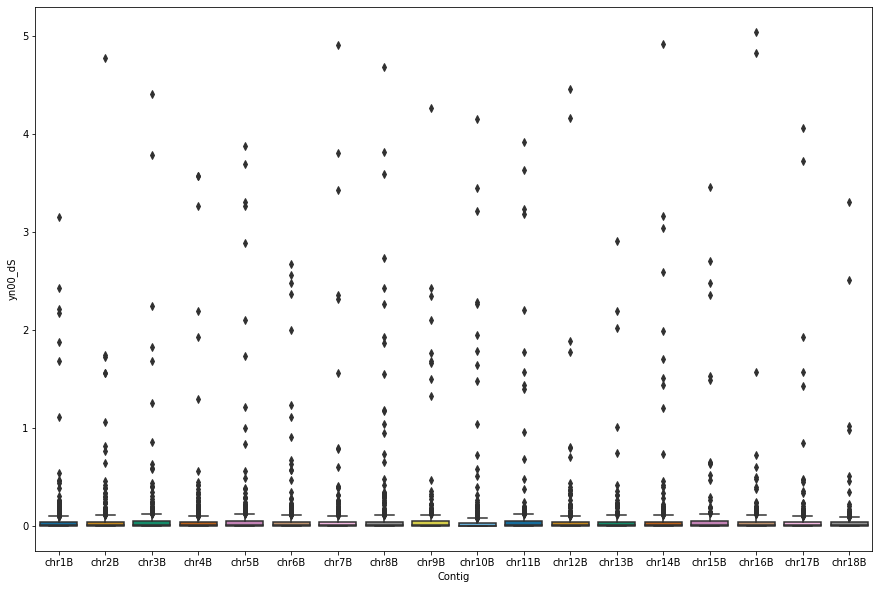

In [53]:
allele_chr=allele_df_merged[allele_df_merged['Contig'].str.contains("chr")]
allele_chr['Contig']= allele_chr['Contig'].str.replace('_134E16_v1', '')
plt.figure(figsize=(15,10))
sns.boxplot(y='yn00_dS', x='Contig', 
                 data=allele_chr, 
                 palette="colorblind")

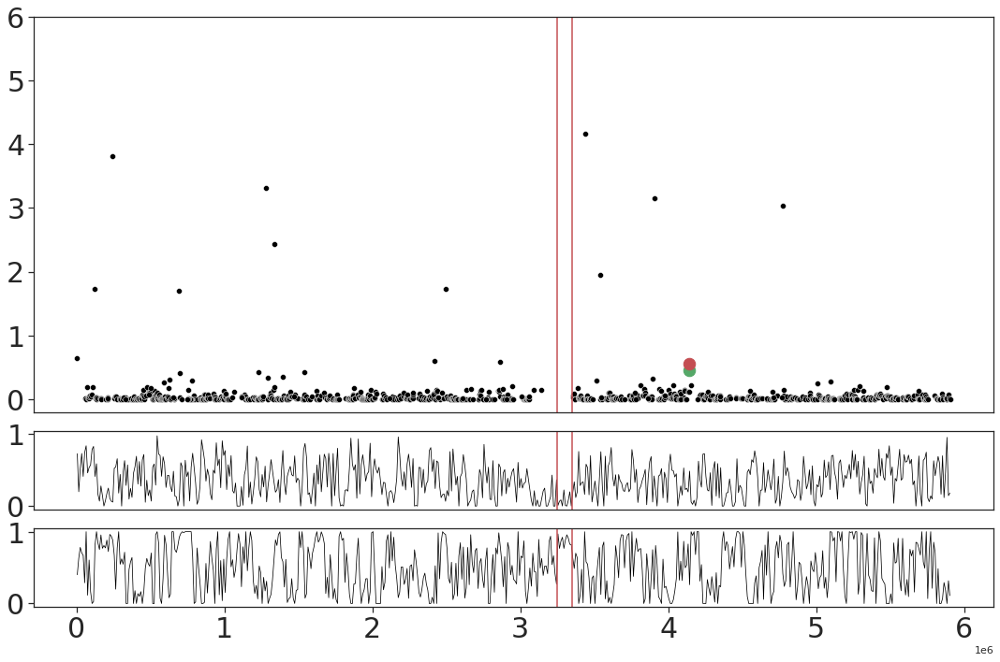

In [15]:
f, axs = plt.subplots(3, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))

g1 = sns.scatterplot(data=allele_df_HD,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
g1.set_xlabel("Loci (bp) ")
#g1.set_ylabel("synonymous divergence rate", fontsize=20)
#g1.text(allele_df_HD.start[allele_df_HD.Target=='Pst134E_008630']+100000,allele_df_HD.yn00_dS[allele_df_HD.Target=='Pst134E_008630']-0.1,"bE-HD", color='green', fontsize = 20, style='italic')
#g1.text(allele_df_HD.start[allele_df_HD.Target=='Pst134E_008631'],allele_df_HD.yn00_dS[allele_df_HD.Target=='Pst134E_008631']+0.2,"bW-HD", color='red', fontsize = 20, style='italic')
g1.tick_params(axis='both', which='major', labelsize=30)
g1.plot(allele_df_HD.start[allele_df_HD.Target=='Pst134E_008630'],allele_df_HD.yn00_dS[allele_df_HD.Target=='Pst134E_008630'],'g.', markersize=25)
g1.plot(allele_df_HD.start[allele_df_HD.Target=='Pst134E_008631'],allele_df_HD.yn00_dS[allele_df_HD.Target=='Pst134E_008631'],'r.', markersize=25)
g1.vlines([centromere.CE_start[centromere.Contig == 'chr4A_134E16_v1'], centromere.CE_end[centromere.Contig == 'chr4A_134E16_v1']], 0, 1, transform=g1.get_xaxis_transform(), colors='r')


g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr4_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False)
g2.set(xlabel=None)
#g2.set_xlabel("Gene position along chromosome 4A", fontsize=20)
g2.title.set_position([0, 1.1])
g2.yaxis.labelpad = 1525
#g2.set_ylabel("Gene density", fontsize=20)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=30)
g1.axis(ymax=5)
g2.vlines([centromere.CE_start[centromere.Contig == 'chr4A_134E16_v1'], centromere.CE_end[centromere.Contig == 'chr4A_134E16_v1']], 0, 1, transform=g2.get_xaxis_transform(), colors='r')


g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr4_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=False)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 4A", fontsize=20)
g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
#g3.set_ylabel("TE", fontsize=25)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=30)
g3.vlines([centromere.CE_start[centromere.Contig == 'chr4A_134E16_v1'], centromere.CE_end[centromere.Contig == 'chr4A_134E16_v1']], 0, 1, transform=g3.get_xaxis_transform(), colors='r')
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1

g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
g1.tick_params(left=True)
g2.tick_params(left=True)
g3.tick_params(left=True)
g3.tick_params(bottom=True)

g1.axis(ymax=6)
#f.suptitle("dS value of genes on Pst 134E chr4", x=0.2, y=0.98, fontsize=23, fontweight="bold")
f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()

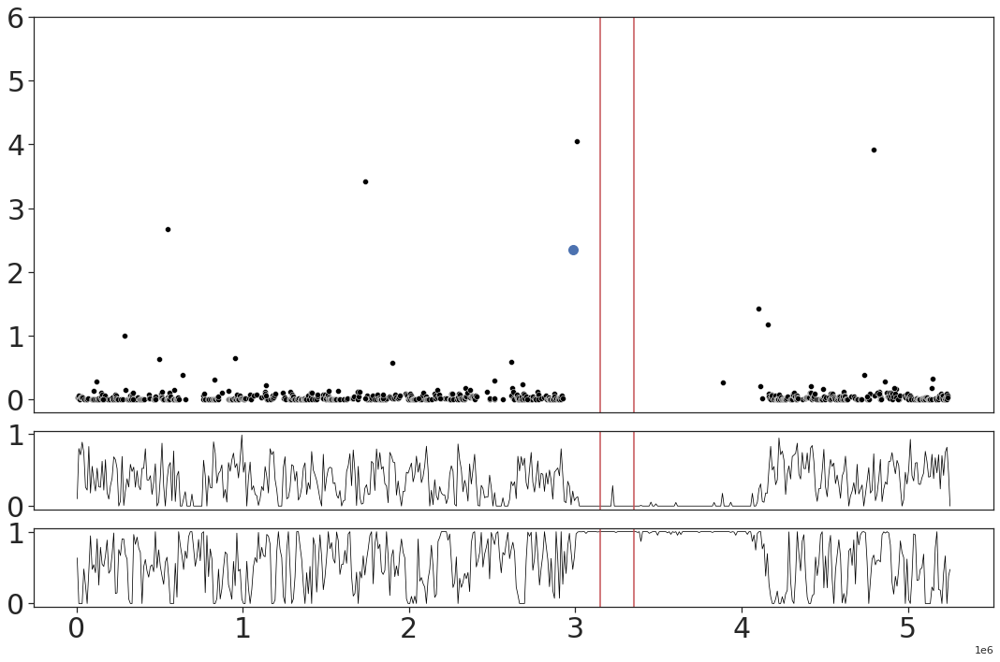

In [17]:
f, axs = plt.subplots(3, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))

g1 = sns.scatterplot(data=allele_df_STE,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
#g1.set_xlabel("Loci (bp) ")
#g1.set_ylabel("synonymous divergence rate", fontsize=20)
#g1.text(allele_df_STE.start[allele_df_STE.Target=='Pst134E_018609'],allele_df_STE.yn00_dS[allele_df_STE.Target=='Pst134E_018609']+0.1,"STE3.2 / STE3.3", color='red', fontsize = 20, style='italic')
g1.plot(allele_df_STE.start[allele_df_STE.Target=='Pst134E_018609'],allele_df_STE.yn00_dS[allele_df_STE.Target=='Pst134E_018609'],'b.', markersize=20)
g1.tick_params(axis='both', which='major', labelsize=30)
g1.vlines([centromere.CE_start[centromere.Contig == 'chr9A_134E16_v1'], centromere.CE_end[centromere.Contig == 'chr9A_134E16_v1']], 0, 1, transform=g1.get_xaxis_transform(), colors='r')

g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr9_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False)
#g2.set_xlabel("Gene position along chromosome 9A", fontsize=20)
g2.title.set_position([0, 1.1])
g2.yaxis.labelpad = 9
#g2.set_ylabel("Gene density", fontsize=20)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=30)
g2.vlines([centromere.CE_start[centromere.Contig == 'chr9A_134E16_v1'], centromere.CE_end[centromere.Contig == 'chr9A_134E16_v1']], 0, 1, transform=g2.get_xaxis_transform(), colors='r')


g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr9_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=False)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 9A", fontsize=20)
g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
g3.set_ylabel("TE", fontsize=20)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=30)
g3.vlines([centromere.CE_start[centromere.Contig == 'chr9A_134E16_v1'], centromere.CE_end[centromere.Contig == 'chr9A_134E16_v1']], 0, 1, transform=g3.get_xaxis_transform(), colors='r')
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
g1.tick_params(left=True)
g2.tick_params(left=True)
g3.tick_params(left=True)
g3.tick_params(bottom=True)
g1.axis(ymax=6)
#f.suptitle("dS value of genes on Pst 134E chr9", x=0.2, y=0.98, fontsize=23, fontweight="bold")
f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()

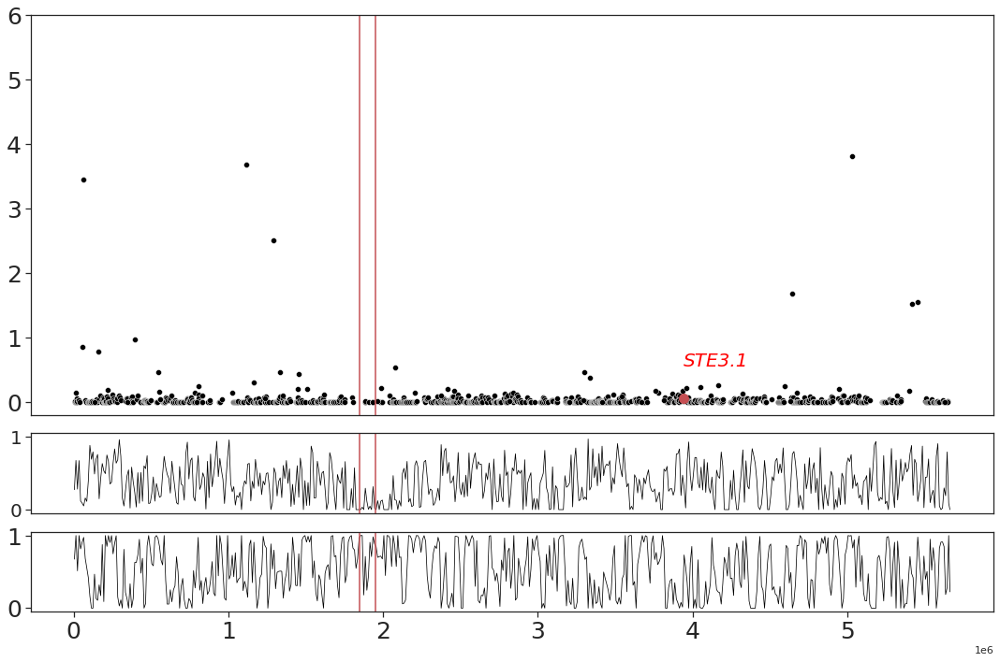

In [23]:
f, axs = plt.subplots(3, 1,sharex=True, figsize=(15,10), gridspec_kw=dict(height_ratios=[5,1,1]))

g1 = sns.scatterplot(data=allele_df_STE3_1,x='start',y='yn00_dS', ax=axs[0], legend=False, color='black')
sns.set()
sns.set_style('white')
g1.set_xlabel("Loci (bp) ")
g1.set_ylabel("synonymous divergence rate", fontsize=20)
g1.text(allele_df_STE3_1.start[allele_df_STE3_1.Target=='Pst134E_002048'],allele_df_STE3_1.yn00_dS[allele_df_STE3_1.Target=='Pst134E_002048']+0.5,"STE3.1", color='red', fontsize = 20, style='italic')
g1.plot(allele_df_STE3_1.start[allele_df_STE3_1.Target=='Pst134E_002048'],allele_df_STE3_1.yn00_dS[allele_df_STE3_1.Target=='Pst134E_002048'],'r.', markersize=20)
g1.tick_params(axis='both', which='major', labelsize=25)
g1.vlines([centromere.CE_start[centromere.Contig == 'chr1A_134E16_v1'], centromere.CE_end[centromere.Contig == 'chr1A_134E16_v1']], 0, 1, transform=g1.get_xaxis_transform(), colors='r')


g2 = sns.lineplot(x="1/2 position", y="Gene density", data=gene_density_chr1_A, ax=axs[1], size=1, legend=False, color='black')
g2.tick_params(bottom=False)
g2.set_xlabel("Gene position along chromosome 1A", fontsize=20)
g2.title.set_position([0, 1.1])
g2.yaxis.labelpad = 9
g2.set_ylabel("Gene density", fontsize=25)
#plt.figure(figsize=(15,0.5))
g2.ticklabel_format(axis="x", style="sci")
g2.tick_params(axis='both', which='major', labelsize=20)
g2.vlines([centromere.CE_start[centromere.Contig == 'chr1A_134E16_v1'], centromere.CE_end[centromere.Contig == 'chr1A_134E16_v1']], 0, 1, transform=g2.get_xaxis_transform(), colors='r')


g3 = sns.lineplot(x="1/2 position", y="TE density", data=TE_density_chr1_A, ax=axs[2], size=1, legend=False, color='black')
g3.tick_params(bottom=False)
g3.set(xlabel=None)
#g3.set_xlabel("Gene position along chromosome 1A", fontsize=20)
g3.title.set_position([0, 1.1])
g3.yaxis.labelpad = 15
g3.set_ylabel("TE", fontsize=20)
#plt.figure(figsize=(15,0.5))
g3.ticklabel_format(axis="x", style="sci")
g3.tick_params(axis='both', which='major', labelsize=25)
g3.vlines([centromere.CE_start[centromere.Contig == 'chr1A_134E16_v1'], centromere.CE_end[centromere.Contig == 'chr1A_134E16_v1']], 0, 1, transform=g3.get_xaxis_transform(), colors='r')
g1.set_ylabel("")
g2.set_ylabel("")
g3.set_ylabel("")
tick_spacing = 1
g1.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
g1.tick_params(left=True)
g2.tick_params(left=True)
g3.tick_params(left=True)
g3.tick_params(bottom=True)
g1.axis(ymax=6)
#f.suptitle("dS value of genes on Pst 134E chr1", x=0.2, y=0.98, fontsize=23, fontweight="bold")
f.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.show()

In [17]:
########## FIGURE PLOTTING ##########

def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return '{p:.2f}%\n({v:d})'.format(p=pct,v=val)
    return my_autopct

def autolabel(rects, labels, ax, fontsize):
    """
    Attach a text label above each bar displaying its height
    """
    for i, rect in enumerate(rects):
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2., height, str(labels[i]), ha='center', va='bottom', fontsize=fontsize)

def getNumNoAlleles(pProteinFastaFile, allele_df):
    with open(pProteinFastaFile) as pProteinFasta:
        pProteinList = []
        for line in pProteinFasta:
            if line.startswith('>'):
                pProteinList.append(line[1:].strip())

    assert(len(pProteinList) == len(set(pProteinList)))


    pairedPProteinList = list(allele_df['Query'])
    pairedPProteinList += list(allele_df['Target'])
    pairedPProteinList = set(pairedPProteinList)
    
    for pairedPProtein in pairedPProteinList:
        if pairedPProtein in pProteinList:
            pProteinList.remove(pairedPProtein)
    
    return len(pProteinList)

#def plotAlleleTypesPie(ax, allele_df, colors, includeNoAlleles=True):
#    '''Plots a pie chart of allele types, with the option of also including 
#    primary proteins with no alleles. Strictly, this is not an accurate representation
#    of the distribution of primary proteins as the reciprocal BLAST-identified (h on p) alleles
#    may result in double-counting of primary proteins.
#    '''
    # OrderedDict to preserve order, so that plots are coloured with same key as the distance 
    # bar graphs. This is a bit of a hack-fix; must enter these by hand again in the same order 
    # as 'matchType' occurs in the alleleAveragesByMatchType DataFrame.
 #   alleleTypeCountDict = collections.OrderedDict()
    
  #  for matchType in allele_df['matchType'].unique():
#        alleleTypeCountDict[matchType] = len(alleleDf[alleleDf['matchType'] == matchType])
    
 #   if includeNoAlleles==True:
 #       numNoAlleles = getNumNoAlleles(P_PROTEINS_FASTA, alleleDf)
 #       alleleTypeCountDict['no_allele'] = numNoAlleles

  #  patches, texts, autotexts = ax.pie(list(alleleTypeCountDict.values()), labels=alleleTypeCountDict.keys(), autopct=make_autopct(list(alleleTypeCountDict.values())), colors=colors)
   # ax.axis('equal')
 #   ax.set_title('Allele Types', loc='center', fontsize=TITLE_SIZE, position=(0.5, 1.1))

def plotLevenshteinBar(alleleAverages, ax, colors):
    '''Plots a bar graph of normalised Levenshtein distances on ax from DataFrame alleleAverages.'''
    
    ind = np.arange(len(alleleAverages.protein_levenshtein))
    rects = ax.bar(ind, alleleAverages.protein_levenshtein, 0.35, color=colors, align='center') 
    
    sns.despine(top=True, right=True)
    
    barLabels = []
    for levDist in alleleAverages.protein_levenshtein:
        barLabels.append(str(int((1-levDist)*100)) + '%')
    autolabel(rects, barLabels, ax, INLINE_LABEL_SIZE)

    ax.set_xticks(ind)
    ax.set_xticklabels(alleleAverages.index, rotation=45)

    # ax.set_xlabel('Allele Types', fontsize=AXIS_LABEL_SIZE)
    ax.set_ylabel('Normalised Levenshtein Distance', fontsize=AXIS_LABEL_SIZE)

    ax.tick_params(axis='both', which='major', labelsize=AXIS_TICK_SIZE, pad=3)

    for tick in ax.get_xaxis().get_major_ticks():
        tick.set_pad(2*tick.get_pad())
        tick.label1 = tick._get_text1()
        
def plotAlleles(allele_df, qCovFilters, tCovFilters, pctIdFilters, levSimFilters, leavePO):
    '''Makes a 3x2 plot with normalised Levenshtein distance plots in column 1 and
    a pie chart representing the distribution of allele types in column 2.
    Each row shows different levels of filtering.
    
    leavePO is a boolean that determines whether only BLAST hits will be filtered (leavePO=True)
    or both BLAST and PO alleles should be filtered (leavePO=False)'''
    cmap = plt.cm.Greens
#    colors = cmap(np.linspace(0.0, 0.6, len(alleleDf['matchType'].unique())))
    
    assert(len(qCovFilters) == len(pctIdFilters) == len(levSimFilters))
    
    fig, ax = plt.subplots(len(qCovFilters), 2, figsize=(30, 12*len(qCovFilters)))
    
    for i in range(len(qCovFilters)):
        
        filteredAlleleDf = filterAlleleDf(allele_df, qCovFilters[i], tCovFilters[i], pctIdFilters[i], levSimFilters[i], True)
        print(filteredAlleleDf[filteredAlleleDf.allele_source == 'PO'].shape[0])
        # levenshtein distance plot
        alleleAveragesByMatchType = filteredAlleleDf.groupby(['matchType']).mean()
        plotLevenshteinBar(alleleAveragesByMatchType, ax[i, 0], colors)
        ax[i, 0].set_xticklabels(alleleAveragesByMatchType.index, rotation=45, ha='right')
        
        # pie plot
        plotAlleleTypesPie(ax[i, 1], filteredAlleleDf)#, colors)
        
        # include filtering criteria in title
        qCovFilter = qCovFilters[i]
        tCovFilter = tCovFilters[i]
        pctIdFilter = pctIdFilters[i]
        levSimFilter = levSimFilters[i]
        if qCovFilter < BASE_QCOV_CUTOFF:
            qCovFilter = BASE_QCOV_CUTOFF
            print('Base QCov cut-off is 70%; if you desire to filter below this value, decrease BASE_QCOV_CUTOFF.')
        if tCovFilter < BASE_TCOV_CUTOFF:
            tCovFilter = BASE_TCOV_CUTOFF
            print('Base TCov cut-off is 70%; if you desire to filter below this value, decrease BASE_TCOV_CUTOFF.')
        if pctIdFilter < BASE_PCTID_CUTOFF:
            pctIdFilter = BASE_PCTID_CUTOFF
            print('Base %ID cut-off is 70%; if you desire to filter below this value, decrease BASE_PCTID_CUTOFF.')
        if not levSimFilter:
            levSimFilter = 0
    
        ax[i, 0].set_title('QCov > %s%%, TCov > %s%%, ID > %s%%, L. sim. > %s%%, PO Filtered: %s' % (qCovFilter, tCovFilter, pctIdFilter, levSimFilter, not leavePO), position=(0.5, 0.85))
        
    fig.tight_layout()
    fig.savefig(os.path.join(FIGURE_PATH, 'fig'), bbox_inches='tight')

NameError: name 'filterAlleleDf' is not defined

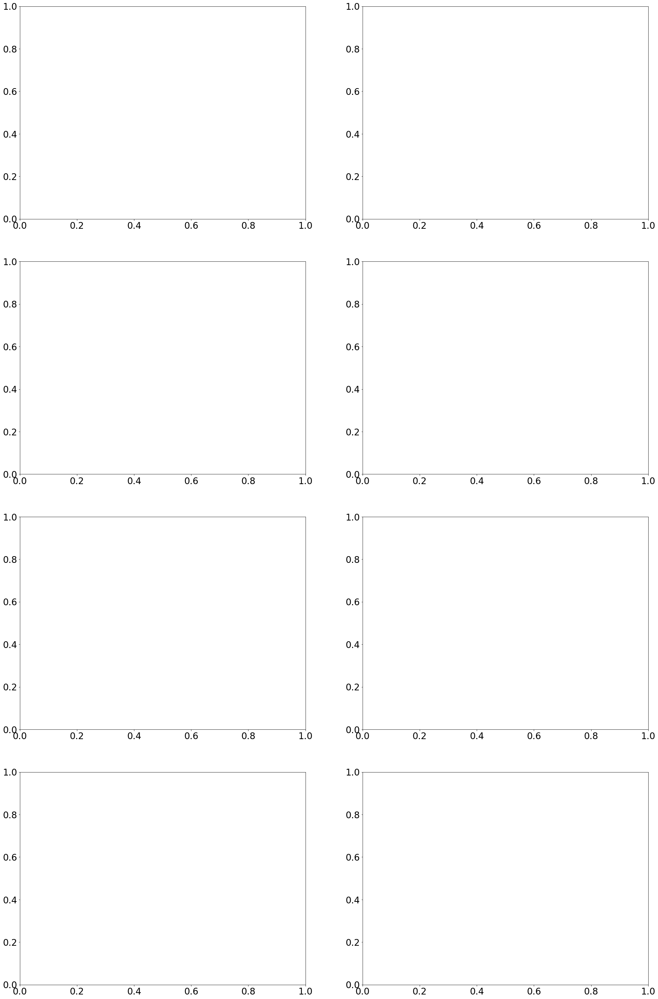

In [18]:
# Used in the pie chart for all text except title
# the ax.pie plotting interface is weird - cannot set other font sizes properly?
mpl.rcParams['font.size'] = 24

TITLE_SIZE = 32
AXIS_LABEL_SIZE = 28
AXIS_TICK_SIZE = 24
INLINE_LABEL_SIZE = 24

# These lists must all be the same length
qCovFilters = [False, 80, 90, 95]
pctIdFilters = [False, 80, 90, 95]
tCovFilters = [False, 80, 90, 95]
levSimFilters = [False, False, False, False]

plotAlleles(allele_df, qCovFilters, tCovFilters, pctIdFilters, levSimFilters, True)